# 2019 UK Accident Analysis

All road traffic accidents involving casualties are logged and reported in the United Kingdom, along 
with (probably) a majority of other non-fatal road traffic accidents. Every year, the government 
releases a large batch of data associated with these reports.We will be using the data 
from 2019 as it represents a very complete sample with a lot of ancillary data available.The task 
is to advise government agencies about how to improve road safety and create a model that would 
predict such accidents and the injuries that they incur.

The data used in this analysis was obtained from the UK government website.

(1) Brief-guide-to road-accidents-and-safety-data. This file contains a very short introduction
to the data set produced by the government.\
(2) variable lookup. This spreadsheet details the large amount of variables present in each of the 
datasets.\
(3) Road Safety Data - Accidents 2019. This spreadsheet contains the details of the accidents 
logged in 2019.\
(4) Road Safety Data - Casualties 2019. This spreadsheet details the casualties contained in the 
logged accidents.\
(5) Road Safety Data- Vehicles 2019. This spreadsheet contains the details of the vehicles 
involved in the accidents.\
(6) Adjustment Files. These files contain government modelling for the probabilities of different 
injuries occurring for each accident.\
(i) adjustment figure guidance. This provides a short amount of government 
guidance on the figures included.\
(ii) cas_adjustment_lookup_2019. This spreadsheet contains the tabulated 
adjusted probabilities of injuries.




The questions (at minimum) that the project addressed are as follows:

(a) Are there significant hours of the day, and days of the week, on which accidents occur?\
(b) For motorbikes, are there significant hours of the day, and days of the week, on which 
accidents occur?\
(c) For pedestrians involved in accidents, are there significant hours of the day, and days of the 
week, on which they are more likely to be involved?\
(d) What impact, if any, does daylight savings have on road traffic accidents in the week after it 
starts and stops?\
(e) What impact, if any, does sunrise and sunset times have on road traffic accidents?\
(f) Are there particular types of vehicles (engine capacity, age of vehicle, etc.) that are more 
frequently involved in road traffic accidents?\
(g) Are there particular conditions (weather, geographic location, situations) that generate more 
road traffic accidents?\
(h) How does driver related variables affect the outcome (e.g., age of the driver, and the purpose 
of the journey)?\
(i) Can we make predictions about when and where accidents will occur, and the severity of the 
injuries sustained from the data supplied to improve road safety? How well do our models 
compare to government models?

In [ ]:
#Import tools: Numpy for advanced linear algebra, matplotlib for visualization and data plotting, 
#pandas for data manipulation and analysis, geopandas for drawing maps
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
import datetime
import geopandas as gpd
import seaborn as sns
import folium
from scipy import stats
from folium import plugins
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.simplefilter("ignore")
pd.set_option('display.max_columns', None)
from catboost import CatBoostRegressor
from geopandas import GeoDataFrame
from lightgbm import LGBMRegressor, LGBMClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, accuracy_score
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, f1_score, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics

%matplotlib inline

In [2]:
#Road Safety Data - Accidents 2019

##specify the path from which the data can be read by pandas. 
#This applies to the remaining datasets as well.


rsda = pd.read_csv("Road Safety Data - Accidents 2019.csv") 

In [3]:
#Road Safety Data - Casualties 2019
rsdc = pd.read_csv("Road Safety Data - Casualties 2019.csv")

In [4]:
#Road Safety Data - Vehicles 2019
rsdv = pd.read_csv("Road Safety Data- Vehicles 2019.csv")

In [5]:
#cas adjustment lookup - 2019
cas = pd.read_csv("cas_adjustment_lookup_2019.csv")

# Description of the dataset

__Accident Dataset__

In [6]:
#The info() method prints information about the DataFrame. 
#The information contains the number of columns, column labels, column data types, memory usage, range index, and the number of cells in each column (non-null values). Note: the info() method actually prints the info.
rsda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117536 entries, 0 to 117535
Data columns (total 32 columns):
 #   Column                                       Non-Null Count   Dtype  
---  ------                                       --------------   -----  
 0   Accident_Index                               117536 non-null  object 
 1   Location_Easting_OSGR                        117508 non-null  float64
 2   Location_Northing_OSGR                       117508 non-null  float64
 3   Longitude                                    117508 non-null  float64
 4   Latitude                                     117508 non-null  float64
 5   Police_Force                                 117536 non-null  int64  
 6   Accident_Severity                            117536 non-null  int64  
 7   Number_of_Vehicles                           117536 non-null  int64  
 8   Number_of_Casualties                         117536 non-null  int64  
 9   Date                                         117536 non-nul

In [7]:
#columns with missing data include: Location_Easting_OSGR, Location_Northing_OSGR, Longitude, Latitude, Time and LSOA_of_Accident_Location 
rsda.isna().sum()

Accident_Index                                    0
Location_Easting_OSGR                            28
Location_Northing_OSGR                           28
Longitude                                        28
Latitude                                         28
Police_Force                                      0
Accident_Severity                                 0
Number_of_Vehicles                                0
Number_of_Casualties                              0
Date                                              0
Day_of_Week                                       0
Time                                             63
Local_Authority_(District)                        0
Local_Authority_(Highway)                         0
1st_Road_Class                                    0
1st_Road_Number                                   0
Road_Type                                         0
Speed_limit                                       0
Junction_Detail                                   0
Junction_Con

In [8]:
#The accident dataset has 117,536 rows and 32 columns
rsda.shape

(117536, 32)

__Casuality Dataset__

In [9]:
#The info() method prints information about the DataFrame. 
#The information contains the number of columns, column labels, column data types, memory usage, range index, and the number of cells in each column (non-null values). Note: the info() method actually prints the info.
rsdc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 153158 entries, 0 to 153157
Data columns (total 16 columns):
 #   Column                              Non-Null Count   Dtype 
---  ------                              --------------   ----- 
 0   Accident_Index                      153158 non-null  object
 1   Vehicle_Reference                   153158 non-null  int64 
 2   Casualty_Reference                  153158 non-null  int64 
 3   Casualty_Class                      153158 non-null  int64 
 4   Sex_of_Casualty                     153158 non-null  int64 
 5   Age_of_Casualty                     153158 non-null  int64 
 6   Age_Band_of_Casualty                153158 non-null  int64 
 7   Casualty_Severity                   153158 non-null  int64 
 8   Pedestrian_Location                 153158 non-null  int64 
 9   Pedestrian_Movement                 153158 non-null  int64 
 10  Car_Passenger                       153158 non-null  int64 
 11  Bus_or_Coach_Passenger              153

In [10]:
##the raw casualty data has no missing values
rsdc.isna().sum()


Accident_Index                        0
Vehicle_Reference                     0
Casualty_Reference                    0
Casualty_Class                        0
Sex_of_Casualty                       0
Age_of_Casualty                       0
Age_Band_of_Casualty                  0
Casualty_Severity                     0
Pedestrian_Location                   0
Pedestrian_Movement                   0
Car_Passenger                         0
Bus_or_Coach_Passenger                0
Pedestrian_Road_Maintenance_Worker    0
Casualty_Type                         0
Casualty_Home_Area_Type               0
Casualty_IMD_Decile                   0
dtype: int64

In [11]:
#The casualty dataset has 153,158 rows and 16 columns
rsdc.shape

(153158, 16)

__Accident Dataset__

In [12]:
#The info() method prints information about the DataFrame. 
#The information contains the number of columns, column labels, column data types, memory usage, range index, and the number of cells in each column (non-null values). Note: the info() method actually prints the info.
rsdv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 216381 entries, 0 to 216380
Data columns (total 23 columns):
 #   Column                            Non-Null Count   Dtype 
---  ------                            --------------   ----- 
 0   Accident_Index                    216381 non-null  object
 1   Vehicle_Reference                 216381 non-null  int64 
 2   Vehicle_Type                      216381 non-null  int64 
 3   Towing_and_Articulation           216381 non-null  int64 
 4   Vehicle_Manoeuvre                 216381 non-null  int64 
 5   Vehicle_Location-Restricted_Lane  216381 non-null  int64 
 6   Junction_Location                 216381 non-null  int64 
 7   Skidding_and_Overturning          216381 non-null  int64 
 8   Hit_Object_in_Carriageway         216381 non-null  int64 
 9   Vehicle_Leaving_Carriageway       216381 non-null  int64 
 10  Hit_Object_off_Carriageway        216381 non-null  int64 
 11  1st_Point_of_Impact               216381 non-null  int64 
 12  Wa

In [13]:
##the raw casualty data has no missing values
rsdv.isna().sum()

Accident_Index                      0
Vehicle_Reference                   0
Vehicle_Type                        0
Towing_and_Articulation             0
Vehicle_Manoeuvre                   0
Vehicle_Location-Restricted_Lane    0
Junction_Location                   0
Skidding_and_Overturning            0
Hit_Object_in_Carriageway           0
Vehicle_Leaving_Carriageway         0
Hit_Object_off_Carriageway          0
1st_Point_of_Impact                 0
Was_Vehicle_Left_Hand_Drive?        0
Journey_Purpose_of_Driver           0
Sex_of_Driver                       0
Age_of_Driver                       0
Age_Band_of_Driver                  0
Engine_Capacity_(CC)                0
Propulsion_Code                     0
Age_of_Vehicle                      0
Driver_IMD_Decile                   0
Driver_Home_Area_Type               0
Vehicle_IMD_Decile                  0
dtype: int64

In [14]:
#The casualty dataset has 153,158 rows and 16 columns
rsdv.shape

(216381, 23)

__Exploring the first five rows of each data__

In [15]:
#Read the accident data and show the header
rsda.head()

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,Local_Authority_(District),Local_Authority_(Highway),1st_Road_Class,1st_Road_Number,Road_Type,Speed_limit,Junction_Detail,Junction_Control,2nd_Road_Class,2nd_Road_Number,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location
0,2019010128300,528218.0,180407.0,-0.153842,51.508057,1,3,2,3,18/02/2019,2,17:50,1,E09000033,3,4202,1,30,1,2,3,4202,0,5,1,1,1,0,0,1,3,E01004762
1,2019010152270,530219.0,172463.0,-0.127949,51.436208,1,3,2,1,15/01/2019,3,21:45,9,E09000022,3,23,2,30,0,-1,-1,0,-1,-1,4,1,1,0,0,1,3,E01003117
2,2019010155191,530222.0,182543.0,-0.124193,51.526795,1,3,2,1,01/01/2019,3,01:50,2,E09000007,4,504,6,30,3,4,6,0,0,0,4,1,1,0,0,1,1,E01000943
3,2019010155192,525531.0,184605.0,-0.191044,51.546387,1,2,1,1,01/01/2019,3,01:20,2,E09000007,4,510,6,20,3,4,4,510,0,0,4,1,1,0,0,1,1,E01000973
4,2019010155194,524920.0,184004.0,-0.200064,51.541121,1,3,2,2,01/01/2019,3,00:40,28,E09000005,3,4003,6,30,6,4,6,0,0,0,4,1,1,0,0,1,1,E01000546


In [16]:
#Read the vehicle data and show the header
rsdv.head()

,Accident_Index,Vehicle_Reference,Vehicle_Type,Towing_and_Articulation,Vehicle_Manoeuvre,Vehicle_Location-Restricted_Lane,Junction_Location,Skidding_and_Overturning,Hit_Object_in_Carriageway,Vehicle_Leaving_Carriageway,Hit_Object_off_Carriageway,1st_Point_of_Impact,Was_Vehicle_Left_Hand_Drive?,Journey_Purpose_of_Driver,Sex_of_Driver,Age_of_Driver,Age_Band_of_Driver,Engine_Capacity_(CC),Propulsion_Code,Age_of_Vehicle,Driver_IMD_Decile,Driver_Home_Area_Type,Vehicle_IMD_Decile
0,2019010128300,1,9,0,-1,-1,-1,-1,-1,-1,-1,4,-1,6,1,58,9,-1,-1,-1,2,1,2
1,2019010128300,2,9,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,6,3,-1,-1,-1,-1,-1,2,1,2
2,2019010152270,1,9,0,18,-1,0,-1,-1,-1,-1,1,-1,6,2,24,5,-1,-1,-1,3,1,3
3,2019010152270,2,9,0,18,-1,0,-1,-1,-1,-1,-1,-1,6,3,-1,-1,-1,-1,-1,6,1,6
4,2019010155191,1,9,0,3,0,1,0,0,0,0,2,1,6,1,45,7,-1,-1,-1,4,1,4


In [17]:
#Read the casualty data and show the header
rsdc.head()

,Accident_Index,Vehicle_Reference,Casualty_Reference,Casualty_Class,Sex_of_Casualty,Age_of_Casualty,Age_Band_of_Casualty,Casualty_Severity,Pedestrian_Location,Pedestrian_Movement,Car_Passenger,Bus_or_Coach_Passenger,Pedestrian_Road_Maintenance_Worker,Casualty_Type,Casualty_Home_Area_Type,Casualty_IMD_Decile
0,2019010128300,1,1,1,1,58,9,3,0,0,0,0,0,9,1,2
1,2019010128300,1,2,2,2,-1,-1,3,0,0,1,0,0,9,1,5
2,2019010128300,1,3,2,2,-1,-1,3,0,0,2,0,0,9,1,5
3,2019010152270,1,1,1,2,24,5,3,0,0,0,0,0,9,1,3
4,2019010155191,2,1,2,2,21,5,3,0,0,0,0,0,1,1,1


# Data Preprocessing and Cleaning

Preprocessing entailed renaming the "Accident index" in the data and converting the "Time" column
to the correct format after the data had been imported. Police Force was inferred to allow us clean
Latitude, Longitude, Location Easting OSGR, and Location Northing OSGR. After combining with Local
Authority (District), LSOA was cleaned using the forward fill approach, and S01007575 was used for
Scotland. All -1 items were replaced with NaN across all records in all data. In addition, missing
values for numeric variables were substituted with the variable set's mean score

In [18]:
##Renaming the accident_index for casualty dataset and keeping it consistent with other datasets
cas.rename({'accident_index': 'Accident_Index'}, axis = 1, inplace = True)

In [19]:
##We treat the missing values in the Time column in rsda data differently as we use the forward fill method to handle missing values
rsda['Time'].fillna(method = 'ffill', inplace = True)

In [20]:
#Creating date time series to enable a more detailed analysis
def creating_date():
    date = rsda['Date'].str.cat(rsda['Time'], sep = ' ')
    date = pd.to_datetime(date)
    rsda['Decimal_Time'] = round (date.dt.hour + date.dt.minute/60, 2)
    rsda['Date_time'] = date
    rsda['Day'] = pd.to_datetime(rsda['Date']).dt.day
    rsda['Week'] = pd.to_datetime(rsda['Date']).dt.week
    rsda['Hour'] = date.dt.hour
    rsda['Hour'] = rsda['Hour'].astype('int')
    rsda['date'] = pd.to_datetime(rsda['Date'])
    rsda['Day_name'] = rsda['date'].dt.strftime('%a')
    rsda['Month'] = rsda['date'].dt.strftime('%b')
creating_date()

In [21]:
#Inferring police force to enable us clean Latitude,Longitude,Location_Easting_OSGR,Location_Northing_OSGR 
#empty_rows = rsda[rsda['Latitude'].isna()]
mode = rsda.groupby('Police_Force')
four = mode.get_group(4)
#four.Latitude.median()

unique_police_values = rsda['Police_Force'].unique()
values = unique_police_values.tolist()

Latitude = []
Longitude =[]
Location_Easting_OSGR = []
Location_Northing_OSGR = []

for y in values:
    new_value = mode.get_group(y)
    Latitude.append(new_value['Latitude'].mean())
    Longitude.append(new_value['Longitude'].mean())
    Location_Easting_OSGR.append(new_value['Location_Easting_OSGR'].mean())
    Location_Northing_OSGR.append(new_value['Location_Northing_OSGR'].mean())

latitude_value = dict(zip(values,Latitude))
longitude_value = dict(zip(values,Longitude))
Location_Easting_OSGR = dict(zip(values, Location_Easting_OSGR))
Location_Northing_OSGR = dict(zip(values, Location_Northing_OSGR))

empty_rows = rsda[rsda['Latitude'].isna()]



In [22]:
def clean(rsda,row,empty,column_name):
    for i in row.items():
        for k,j in empty.iterrows():
            if j['Police_Force'] == i[0]:
                rsda.loc[[k], (column_name)] = i[1]

In [23]:
clean(rsda,latitude_value,empty_rows,'Latitude')
clean(rsda,longitude_value,empty_rows,'Longitude')
clean(rsda,Location_Easting_OSGR,empty_rows,'Location_Easting_OSGR')
clean(rsda,Location_Northing_OSGR,empty_rows,'Location_Northing_OSGR')

In [24]:
#LSOA was cleaned using forward fill method after grouping with Local_Authority_(District) 
rsda['LSOA_of_Accident_Location'] = rsda.groupby('Local_Authority_(District)')['LSOA_of_Accident_Location'].ffill()

In [25]:
#S01007575 was used for Scotland
rsda['LSOA_of_Accident_Location'] = rsda['LSOA_of_Accident_Location'].fillna('S01007575')

In [26]:
rsda.isna().sum()

Accident_Index                                 0
Location_Easting_OSGR                          0
Location_Northing_OSGR                         0
Longitude                                      0
Latitude                                       0
Police_Force                                   0
Accident_Severity                              0
Number_of_Vehicles                             0
Number_of_Casualties                           0
Date                                           0
Day_of_Week                                    0
Time                                           0
Local_Authority_(District)                     0
Local_Authority_(Highway)                      0
1st_Road_Class                                 0
1st_Road_Number                                0
Road_Type                                      0
Speed_limit                                    0
Junction_Detail                                0
Junction_Control                               0
2nd_Road_Class      

In [27]:
rsda.head()

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,Local_Authority_(District),Local_Authority_(Highway),1st_Road_Class,1st_Road_Number,Road_Type,Speed_limit,Junction_Detail,Junction_Control,2nd_Road_Class,2nd_Road_Number,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Decimal_Time,Date_time,Day,Week,Hour,date,Day_name,Month
0,2019010128300,528218.0,180407.0,-0.153842,51.508057,1,3,2,3,18/02/2019,2,17:50,1,E09000033,3,4202,1,30,1,2,3,4202,0,5,1,1,1,0,0,1,3,E01004762,17.83,2019-02-18 17:50:00,18,8,17,2019-02-18,Mon,Feb
1,2019010152270,530219.0,172463.0,-0.127949,51.436208,1,3,2,1,15/01/2019,3,21:45,9,E09000022,3,23,2,30,0,-1,-1,0,-1,-1,4,1,1,0,0,1,3,E01003117,21.75,2019-01-15 21:45:00,15,3,21,2019-01-15,Tue,Jan
2,2019010155191,530222.0,182543.0,-0.124193,51.526795,1,3,2,1,01/01/2019,3,01:50,2,E09000007,4,504,6,30,3,4,6,0,0,0,4,1,1,0,0,1,1,E01000943,1.83,2019-01-01 01:50:00,1,1,1,2019-01-01,Tue,Jan
3,2019010155192,525531.0,184605.0,-0.191044,51.546387,1,2,1,1,01/01/2019,3,01:20,2,E09000007,4,510,6,20,3,4,4,510,0,0,4,1,1,0,0,1,1,E01000973,1.33,2019-01-01 01:20:00,1,1,1,2019-01-01,Tue,Jan
4,2019010155194,524920.0,184004.0,-0.200064,51.541121,1,3,2,2,01/01/2019,3,00:40,28,E09000005,3,4003,6,30,6,4,6,0,0,0,4,1,1,0,0,1,1,E01000546,0.67,2019-01-01 00:40:00,1,1,0,2019-01-01,Tue,Jan


In [28]:
rsda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117536 entries, 0 to 117535
Data columns (total 40 columns):
 #   Column                                       Non-Null Count   Dtype         
---  ------                                       --------------   -----         
 0   Accident_Index                               117536 non-null  object        
 1   Location_Easting_OSGR                        117536 non-null  float64       
 2   Location_Northing_OSGR                       117536 non-null  float64       
 3   Longitude                                    117536 non-null  float64       
 4   Latitude                                     117536 non-null  float64       
 5   Police_Force                                 117536 non-null  int64         
 6   Accident_Severity                            117536 non-null  int64         
 7   Number_of_Vehicles                           117536 non-null  int64         
 8   Number_of_Casualties                         117536 non-null  in

In [29]:
'''From the variable lookup, it is inferred that -1 is exported for null or out of range values. As part of the data cleaning process , we replace -1 with NaN and we fill missing data using mean for numeric variables.'''

def treat_subcol(df):
  for col in df.select_dtypes(include = ['int64','float64']).columns:
    df[col] = df[col].replace(-1, np.NaN)  #change -1 values to NaN for int64 and float64 columns
    sub_col = df.select_dtypes(include=['int64', 'float64']).columns.tolist()  #get a list of all integer and float variables in accident, vehicle and casualty data
    df[sub_col] = df[sub_col].apply(lambda x: x.fillna(round(x.mean(),0),axis=0))

In [30]:
#Applying the above defined function to accident, casualty and vehicle data
treat_subcol(rsda)
treat_subcol(rsdc)
treat_subcol(rsdv)

# Data Visualization

__Question A(i): Are there significant days of the week on which accidents occur?__

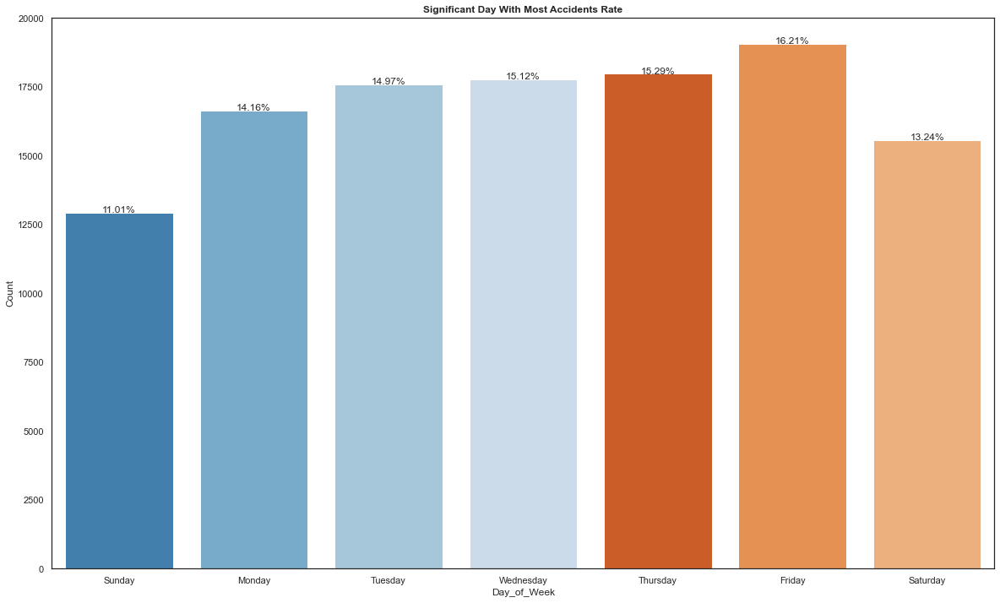

In [31]:
#Plotting a graph to display the most day accident happens
sns.set(style="white",palette = 'tab20c')
plt.figure(figsize=(20,12))
weekplot = sns.countplot(x='Day_of_Week',data=rsda)
weekplot.set(xlabel='Day_of_Week', ylabel='Count')
for p in weekplot.patches: 
    height = p.get_height() 
    weekplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(rsda))*100)+'%',  
      ha="center") 
weekplot.set(xticklabels=['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday'])
plt.title('Significant Day With Most Accidents Rate', fontweight='bold')
plt.show()

>*Given the number of people travelling on Fridays (or racing home from work in preparation for the
weekend), the graph above shows that the number of accidents occurs mostly at the same level
from Tuesdays to Thursdays. However, an accident occurs mostly on Friday of the week, with Sunday
being the safest day of the week on UK roads*

__Question A(ii): Are there significant hours of the day on which accidents occur?__

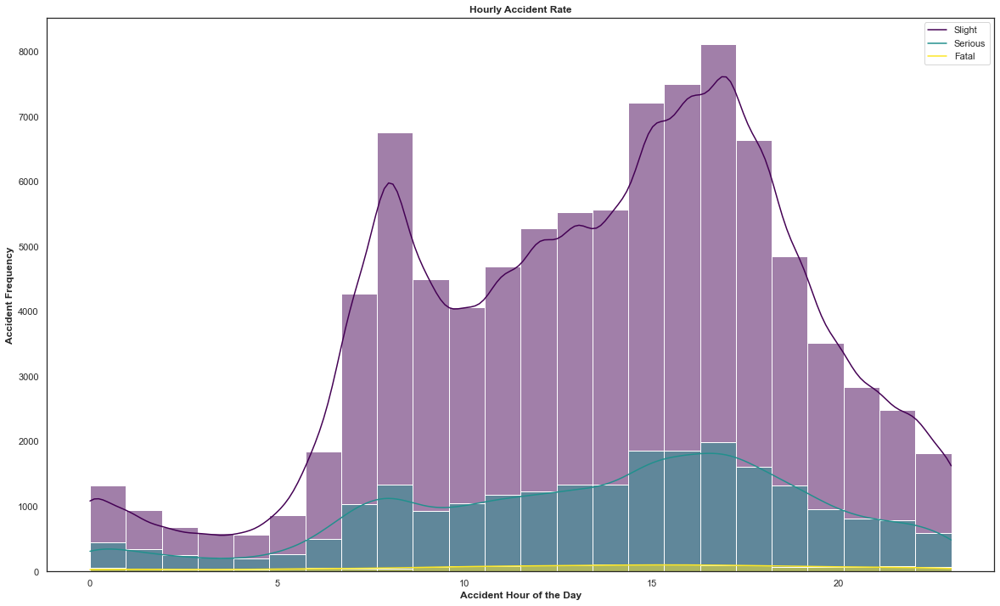

In [32]:
plt.figure(figsize=(20,12))
sns.histplot(data=rsda, x='Hour', hue ='Accident_Severity', bins=24, kde=True, palette = 'viridis_r')
plt.xlabel('Accident Hour of the Day', fontweight='bold')
plt.ylabel('Accident Frequency',fontweight='bold')
plt.title('Hourly Accident Rate', fontweight='bold')
plt.legend(['Slight', 'Serious','Fatal'])
plt.show()


>*Most of the accidents occurred between the 17th, this was followed closely by 16th, 15th, and 18th
hours of the day most common, when people are commuting home from work, 8th hour was also
part of the significant hour.*

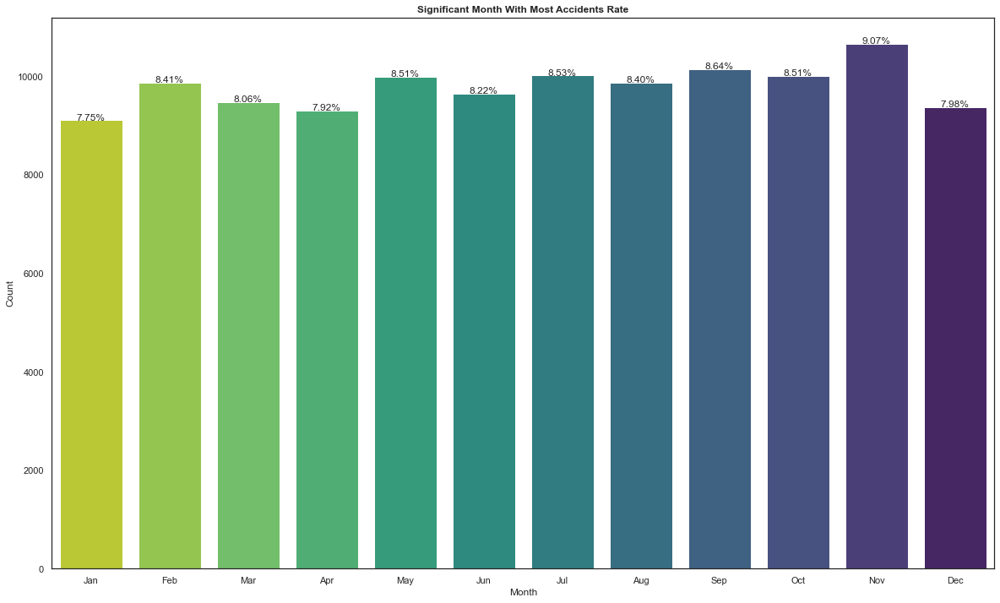

In [33]:
###Plotting a graph to display the most month accident happens and accident severity

sns.set(style="white")
plt.figure(figsize=(20,12))
monthplot = sns.countplot(x='Month',data=rsda, palette = 'viridis_r')
monthplot.set(xlabel='Month', ylabel='Count')
for p in monthplot.patches: 
    height = p.get_height() 
    monthplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(rsda))*100)+'%',  
      ha="center") 
monthplot.set(xticklabels=['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
plt.title('Significant Month With Most Accidents Rate', fontweight='bold')
plt.show()

 >*Further analysis reveals that most recorded accidents in the UK occurred in November, with the
exact date being November 29th, which is black Friday. Many retailers got a head start on the
traditional black Friday deals, so it is expected that people will rush after work to stores to get better
deals before the store closes, with a peak at 15:00 hour of the day.*  

In [34]:
#Time of accident in november
highest_month = rsda[(rsda['Accident_Severity'] == 3) & (rsda['Month'] == 'Nov')]

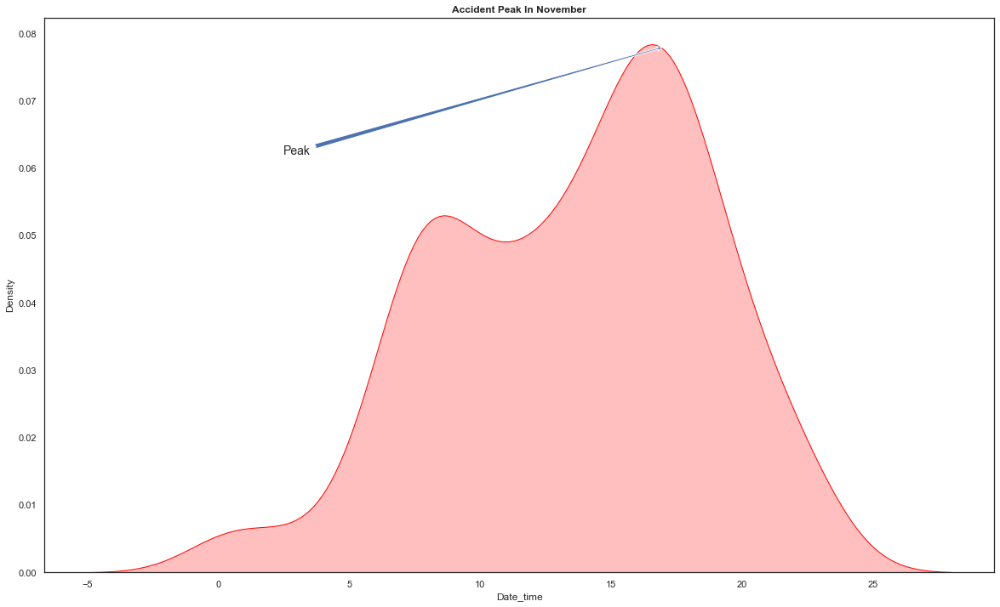

In [35]:
#Checking the peak time most accidnt occured

fig,ax = plt.subplots(figsize=(20,12))
sns.kdeplot(highest_month.Date_time.dt.hour,fill=True, bw_adjust=2,color='red',data=highest_month);
plt.annotate('Peak',xy=(17,0.078),xytext=(2.5,0.062), arrowprops={'arrowstyle':'fancy'}, fontsize=14)
plt.title('Accident Peak In November', fontweight='bold')
plt.show()

 >*Above shows most accident happened at 17:00 in November.*

In [36]:
##Assigning stripping date to get specific day most accident happen in United Kingdom 2019
date = rsda['Date'].str.cat(rsda['Time'], sep =' ')
date = pd.to_datetime(date)

In [37]:
rsda['date'] = pd.to_datetime(rsda['Date'])
rsda['day'] = rsda['date'].dt.strftime('%d')

In [38]:
Day = rsda[rsda["Month"] == 'Nov']

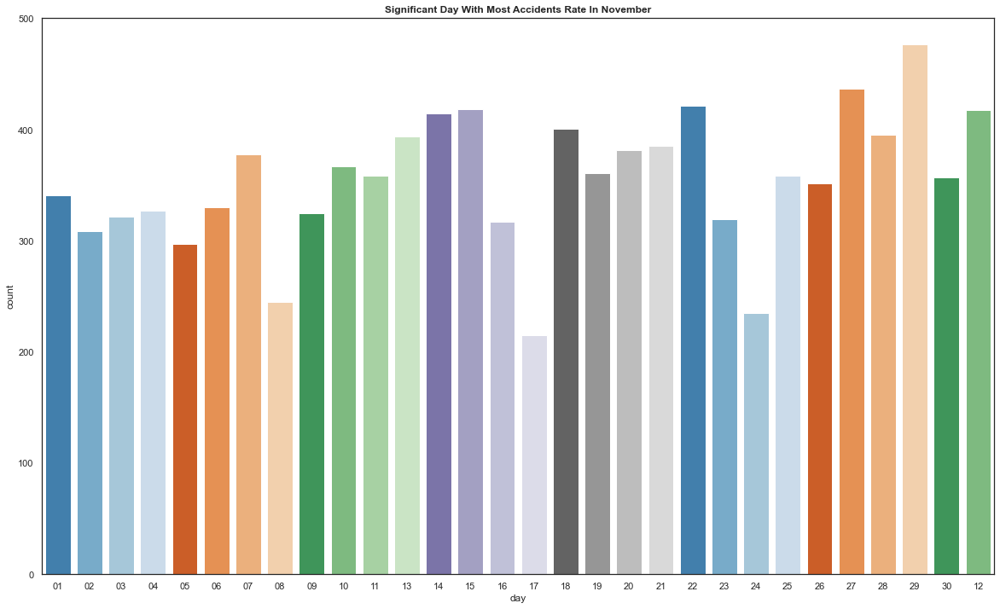

In [39]:
#Plot
fig, ax = plt.subplots(figsize=(20,12))
sns.countplot(x=Day['day'], palette = 'tab20c')
plt.title('Significant Day With Most Accidents Rate In November', fontweight='bold')
plt.show()

 >*Above shows that most accidents happened in November 29 which is black friday, Many retailers got a jump on the traditional black friday deals so it is expected people rush after work to stores to get better deals before the store closes.*

>*Checking the heat map correlation of the accident.*

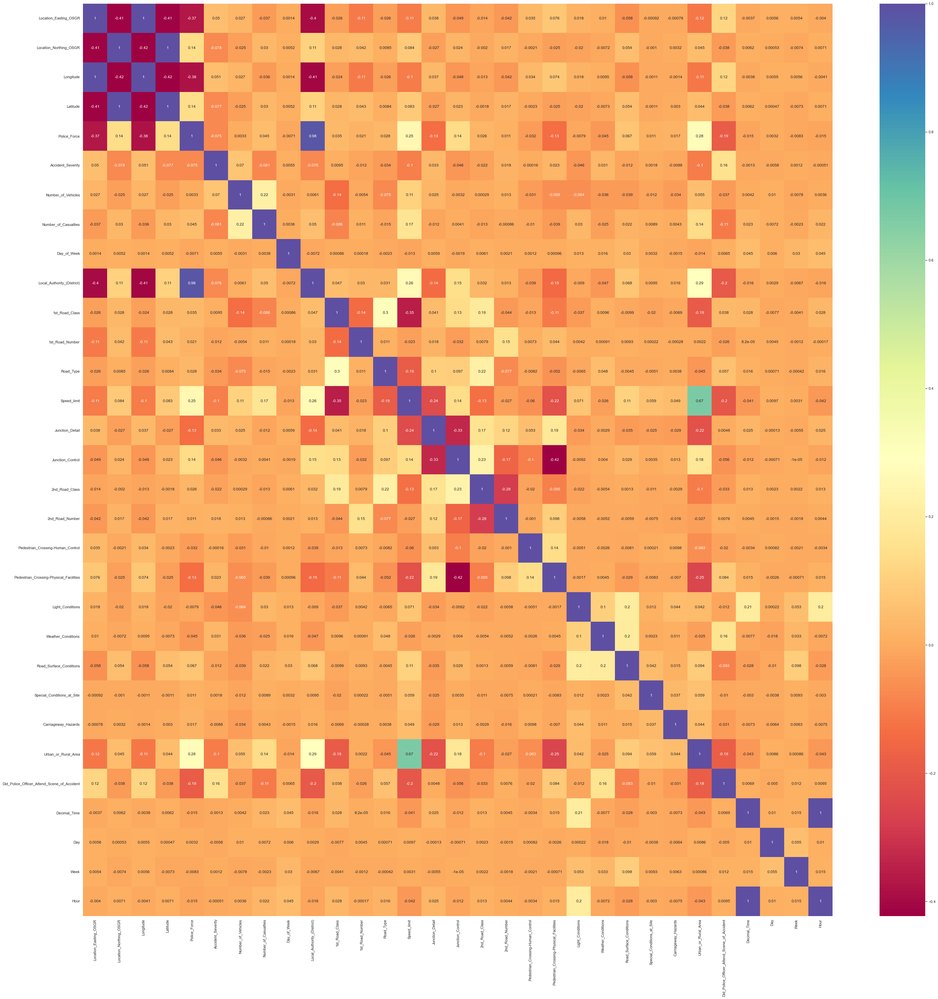

In [40]:
plt.figure(figsize = (50,50))
sns.heatmap(data = rsda.corr(),annot = True, cmap = "Spectral")
plt.show()

>*There is a correlation between Speed_limit and Urban_of_Rural_Area*, 
>*There is also a correlation between Police_Force and Local_Authority_(District)*, 
>*There is a correlation between location_easting_OSGR and Longitude*, 
>*There is a correlation between location_northing_OSGR and Latitude*.

__Question B(i): For motorbikes, are there significant hours of the day on which accidents occur?__

To get the significant hours of the day and day of the week on which accidents occur, we merge the accident data with the vehicle data using the accident index as the primary key. Under vehicle types we classify labels 2,3,4,5,23 and 97 as motorbikes*

In [41]:
##we use inner join to capture only unique accidents that were recorded both in the accident and vehicle data.
motorbikes_accident = pd.merge(rsda, rsdv, on = ['Accident_Index'], how = 'inner') 
##classify labels 2,3,4,5,23 and 97 as motorbikes
motorbikes = motorbikes_accident[(motorbikes_accident['Vehicle_Type'] == 2) | (motorbikes_accident['Vehicle_Type'] == 3) | (motorbikes_accident['Vehicle_Type'] == 4) | (motorbikes_accident['Vehicle_Type'] == 5) |(motorbikes_accident['Vehicle_Type'] == 23)  |(motorbikes_accident['Vehicle_Type'] == 97)  ]

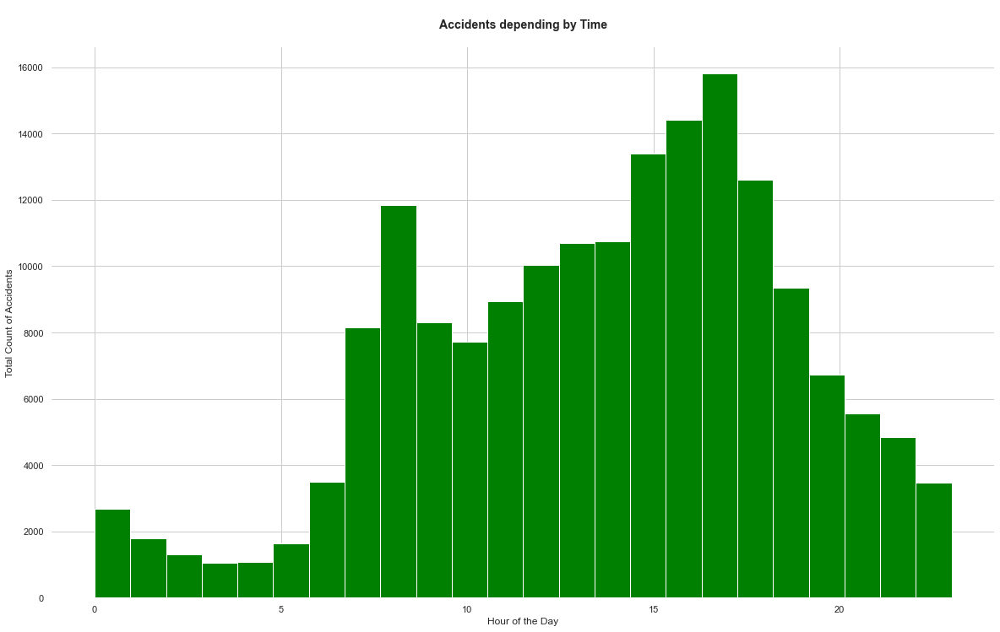

In [42]:
motorbikes_accident['Hour'] = motorbikes_accident['Time'].str[0:2]

motorbikes_accident['Hour'] = pd.to_numeric(motorbikes_accident['Hour'])

motorbikes_accident = motorbikes_accident.dropna(subset=['Hour'])

motorbikes_accident['Hour'] = motorbikes_accident['Hour'].astype('int')

sns.set_style('white')
fig, ax = plt.subplots(figsize=(20,12))


motorbikes_accident.Hour.hist(bins=24, ax=ax, color="Green")
ax.set_title('\nAccidents depending by Time\n', fontsize=14, fontweight='bold')
ax.set(xlabel='Hour of the Day', ylabel='Total Count of Accidents' )

sns.despine(top=True, right=True, left=True, bottom=True);

>*Most accidents happened during daytime, 17th hour has the highest followed by 16th hour which is
towards closing time and we have 8:00 which is towards rush hour.*

__Question B(ii): For motorbikes, are there significant days of the day on which accidents occur?__

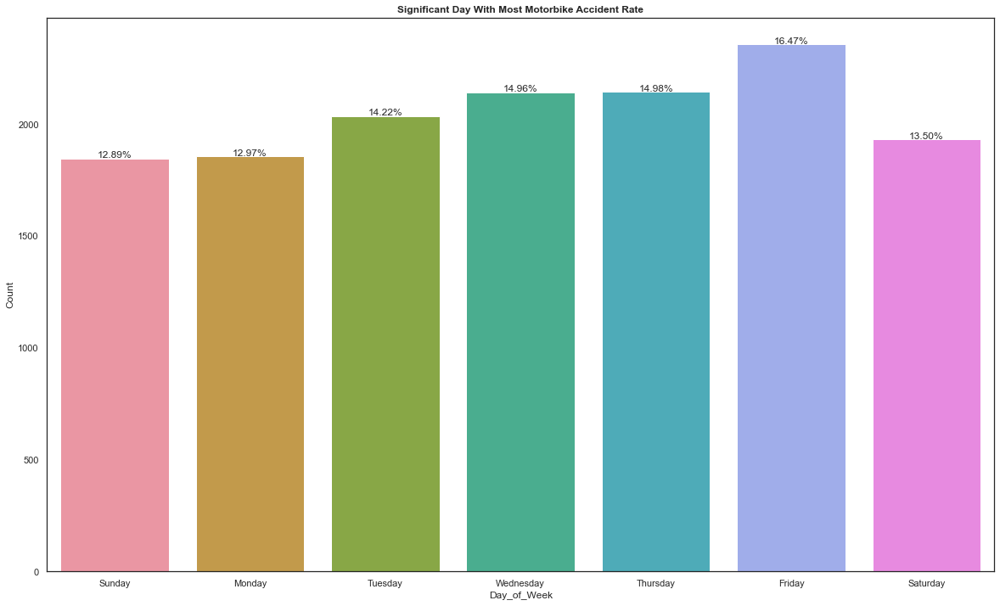

In [43]:
#Plotting significant days which motorbike accident occurs
sns.set(style="white", palette = 'copper')
plt.figure(figsize=(20,12))
weekplot = sns.countplot(x='Day_of_Week',data=motorbikes)
weekplot.set(xlabel='Day_of_Week', ylabel='Count')
for p in weekplot.patches: 
    height = p.get_height() 
    weekplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(motorbikes))*100)+'%',  
      ha="center") 
weekplot.set(xticklabels=['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday'])
plt.title('Significant Day With Most Motorbike Accident Rate', fontweight='bold')
plt.show()

>*From the chart above, we can see that most of the motorbike accidents recorded in the UK happen on the 6th day (Friday), followed by Thursday, Wednesday and Tuesday of the week.*

__Question B(iii): For motorbikes, Which type of motorbike have the highest count of accident?__

In [44]:
#To get the type of motorbikes count
motorbikes["Vehicle_Type"].value_counts()

3.0     6653
5.0     4255
4.0     1774
2.0     1227
97.0     358
23.0      50
Name: Vehicle_Type, dtype: int64

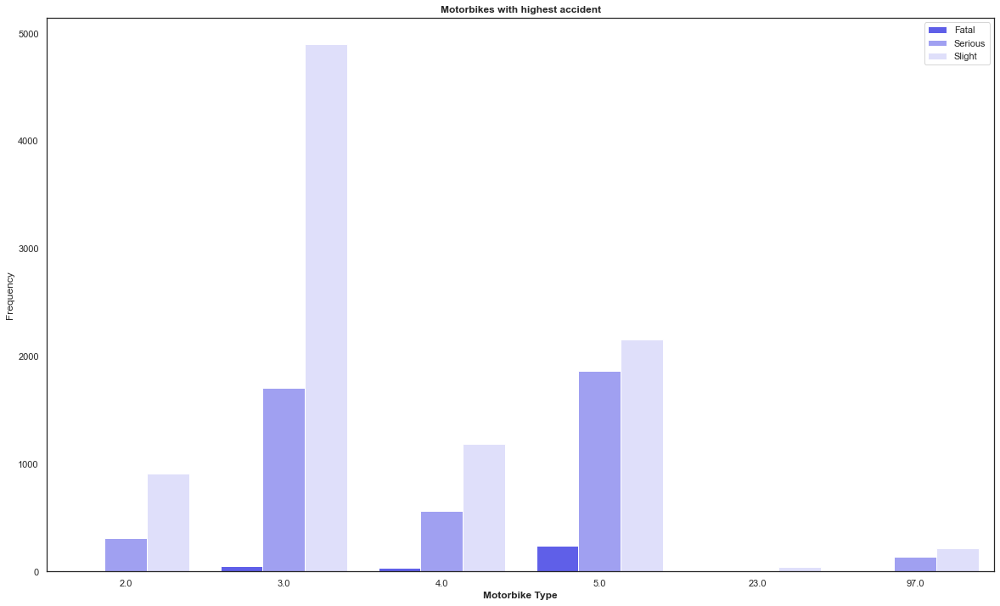

In [45]:
#Plotting type of motobike that has highest count of accident
sns.set(style="white", palette = 'bwr')
plt.figure(figsize=(20,12))
motorbikes_plot = sns.countplot(x='Vehicle_Type',data=motorbikes, hue = 'Accident_Severity')
plt.title('Motorbikes with highest accident',fontweight='bold' )
plt.xlabel("Motorbike Type", fontweight='bold')
plt.ylabel("Frequency")
plt.legend(['Fatal', 'Serious','Slight'])
plt.show()

>*A further analysis shows that Motorcycle 125cc has highest count of slight causality severity,
Motorcycle over 500cc has the most serious causality severity which can be concluded because of
the capacity.*

__Question B(iii): For motorbikes, are there significant month of the day on which accidents occur?__

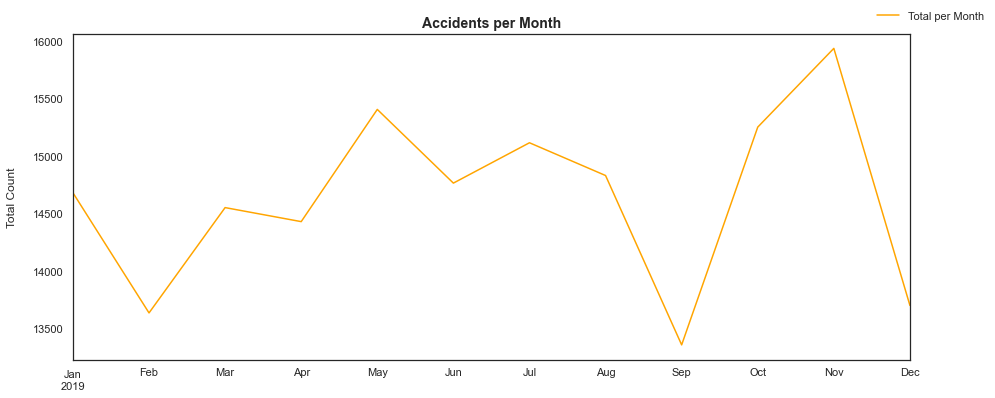

In [46]:
# prepare plot
sns.set_style('white')
fig, ax = plt.subplots(figsize=(15,6))

# plot
motorbikes_accident.set_index('date').resample('M').size().plot(label='Total per Month', color='Orange', ax=ax)
motorbikes_accident.set_index('date').resample('M').size().rolling(window=10).mean()

ax.set_title('Accidents per Month', fontsize=14, fontweight='bold')
ax.set(ylabel='Total Count\n', xlabel='')
ax.legend(bbox_to_anchor=(1.1, 1.1), frameon=False)

# remove all spines
#sns.despine(ax=ax, top=True, right=True, left=True, bottom=False);

>*From the chart above, we can see that most of the motorbike accidents recorded in the UK happen on the 11th month which is november, followed by May.*

__Question C: For pedestrians involved in accidents, are there significant hours of the day, and days of the week, on which they are more likely to be involved?__

To get the significant hours of the day and day of the week on which accidents occur for pedestrians, we merge the accident data with the casualty data using the accident index as the primary key. Under casualty data, we have the pedestrian location which will be used for the analysis.

In [47]:
##Merging Accident data with the Casualty data
pedestrian_accident = pd.merge(rsda, rsdc, on = ['Accident_Index'], how = 'inner') ##we use inner join to capture only unqiue accidents that were recorded both in the accident and casualty data.
pedestrian = pedestrian_accident[(pedestrian_accident['Casualty_Class'] == 3)]

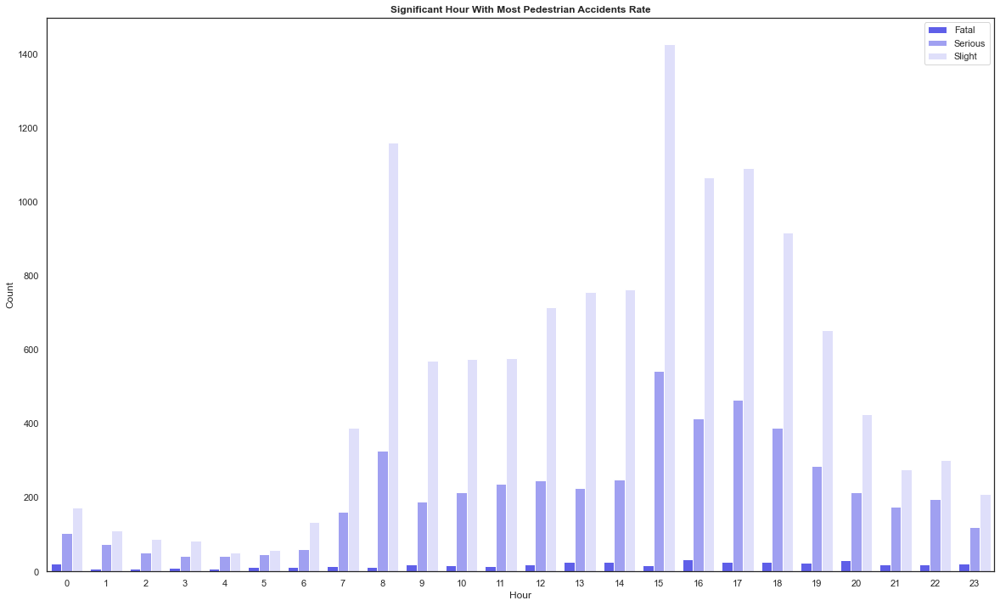

In [48]:
#plotting for hour pedestrians involved in an accidnet
sns.set(style="white", palette = 'bwr')
plt.figure(figsize=(20,12))
Hourplot = sns.countplot(x='Hour',data=pedestrian, hue= 'Accident_Severity')
Hourplot.set(xlabel='Hour', ylabel='Count')
plt.legend(['Fatal', 'Serious','Slight'])
plt.title('Significant Hour With Most Pedestrian Accidents Rate', fontweight='bold')
plt.show()

>*(i) from the chart above, we can see that most of the pedestrian accidents recorded in the UK happen on 15th hour of the day, followed by 8th, 16th, 17th, 18th all this falls under rush hour.*

__Question C(ii): For pedestrians involved in accidents, are there significant days of the week, on which they are more likely to be involved?__

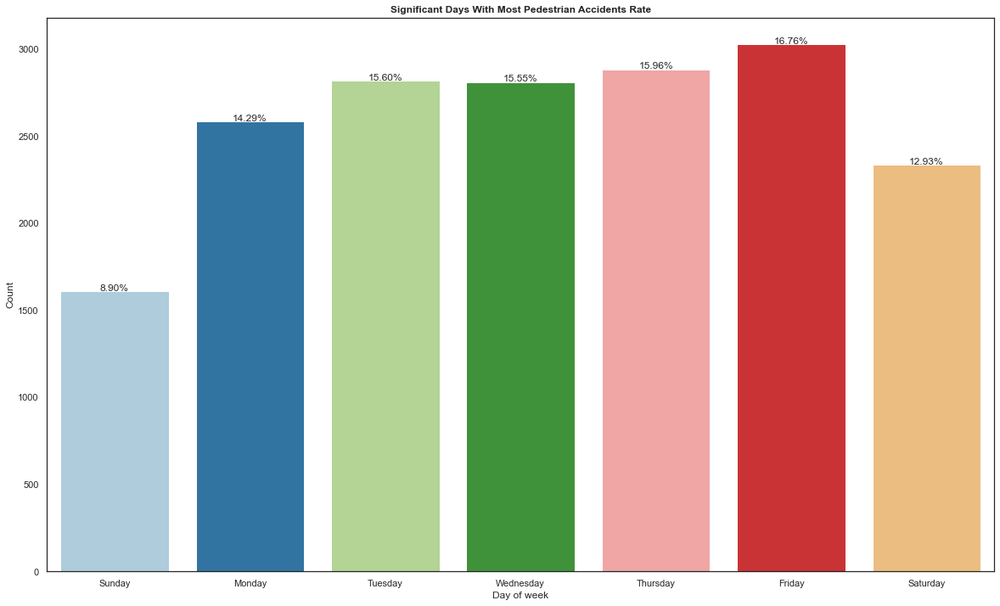

In [49]:
##plotting for days pedestrians involved in an accidnet
sns.set(style="white", palette = 'Paired')
plt.figure(figsize=(20,12))
weekplot = sns.countplot(x='Day_of_Week',data=pedestrian)
weekplot.set(xlabel='Day of week', ylabel='Count')
for p in weekplot.patches: 
    height = p.get_height() 
    weekplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(pedestrian))*100)+'%',  
      ha="center") 
weekplot.set(xticklabels=['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday'])
plt.title('Significant Days With Most Pedestrian Accidents Rate', fontweight='bold')
plt.show()

>*(ii) Given the number of people travelling on Fridays (or racing home from work in preparation for the
weekend), the graph above shows that the number of accidents occurs mostly at the same level
from Tuesdays to Thursdays. However, an accident occurs mostly on Friday of the week, with Sunday
being the safest day of the week on UK roads.*

__Question D: What impact, if any, does daylight savings have on road traffic accidents in the week after it starts and stops?__

>* Daylight saving time 2019 in the United Kingdom began at 1:00AM on Sunday, March 31 and ended at 2:00AM on Sunday, October 27, 2019 according to https://www.timeanddate.com/time/change/uk?year=2019

In [50]:
#Daily Accident Frequency Recorded in the Week after DST starts in March 31, 2019
dst_after_march31 = rsda.loc[rsda.date.between('2019-04-01', '2019-04-07')].groupby(['date'])['Accident_Index'].count().values
dst_after_march31

array([233, 336, 312, 348, 307, 348, 389], dtype=int64)

In [51]:
#Daily Accident Frequency Recorded in the Week after DST stops in Oct 27, 2019
dst_after_oct27 = rsda.loc[rsda.date.between('2019-10-28', '2019-11-03')].groupby(['date'])['Accident_Index'].count().values
dst_after_oct27

array([315, 320, 320, 348, 341, 309, 322], dtype=int64)

In [52]:
stats.ttest_rel(dst_after_march31, dst_after_oct27)

Ttest_relResult(statistic=-0.015533463248284144, pvalue=0.9881102269256239)

>* H0: μ1 average accident frequency in the week after DST starts = μ2 average accident frequency in the week after DST stops
>* H1: μ1 average accident frequency in the week after DST starts ≠ μ2 average accident frequency in the week after DST stops


Since the pvalue is greater than the significance level of 0.05, we accept the null hypothesis which means DST does not have an effect on the number of road accidents recorded in the week after it starts and stops although the chat below shows there is a difference.

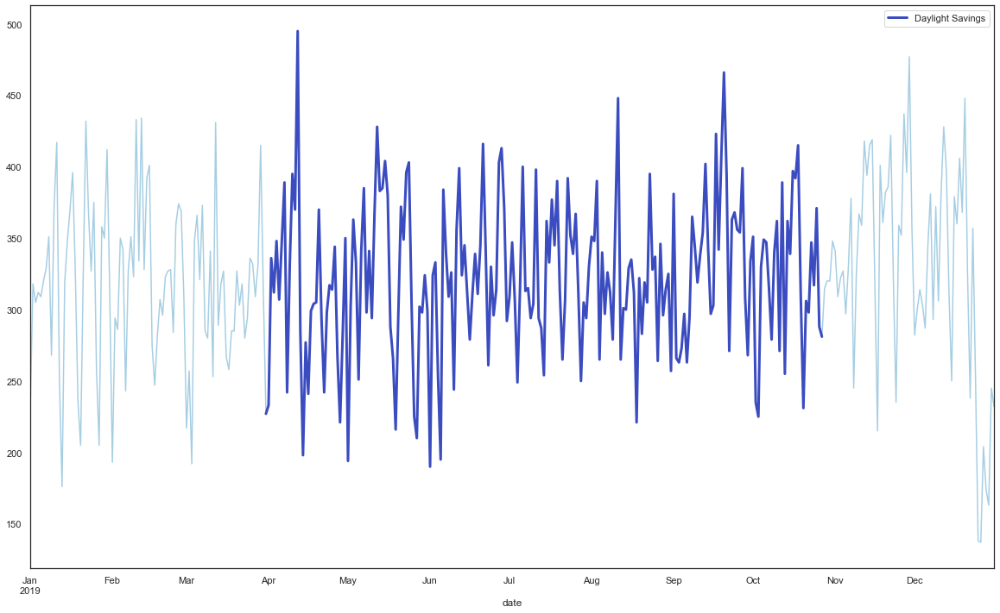

In [53]:
rsda.groupby(['date'])['Accident_Index'].count().plot(legend = False)
##Dayligt saving period
rsda.loc[rsda.date.between('2019-03-31', '2019-10-27')].groupby(['date'])['Accident_Index'].count().plot(legend = True, cmap= plt.cm.coolwarm,label = 'Daylight Savings', figsize=(20,12), linewidth = 3) 
plt.show()

 *Note: The chart with the __dark blue__ represent the period when daylight savings was observed in the UK in 2019 while the lines in __light-blue__ represent all timeframes from January to December. It is seen that there was one major significant spike in the number of accidents recorded per day at the early stage of the daylight saving period. Also, there were two other spikes recorded that were beyond the usual accident frequency levels of other periods before the last quarter. With these observations, we can consider daylight saving period to have some effect on the number of accidents most especially a week after it began.*

__Question E: What impact, if any, does sunrise and sunset times have on road traffic accidents?__

Using sunrise and sunset data for London(UK) provided on https://www.sunrise-and-sunset.com/en/sun/united-kingdom/bristol, the average sunrise time is 6:27 and the average sunset time is 18:41.

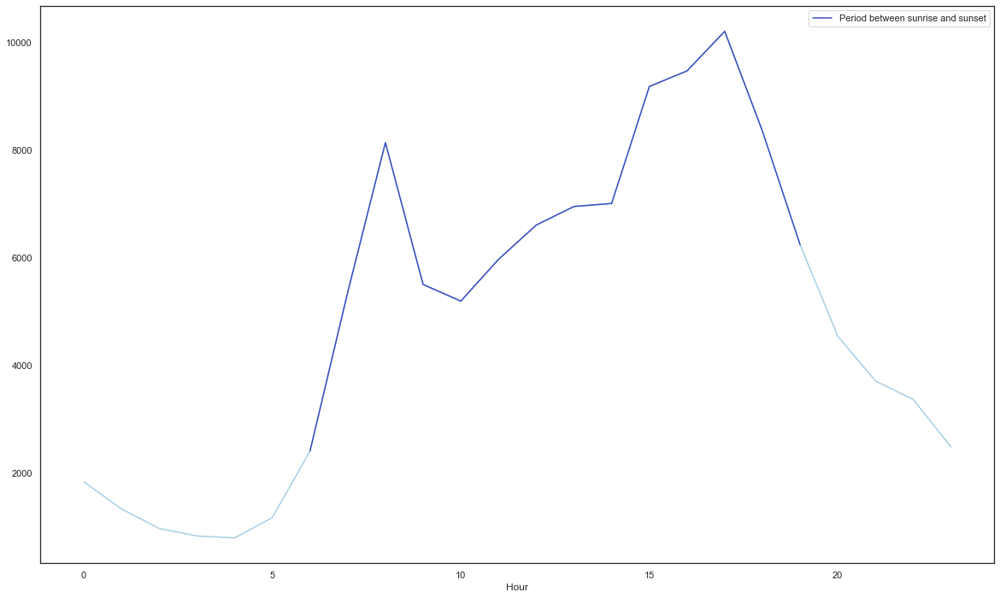

In [54]:
rsda.groupby(['Hour'])['Accident_Index'].count().plot(legend = False)
rsda.loc[rsda.Hour.between(6, 19)].groupby(['Hour'])['Accident_Index'].count().plot(legend = True,figsize=(20,12),cmap= plt.cm.coolwarm,label = 'Period between sunrise and sunset')
plt.show()

From the chart above, sunrise time was pegged to 6th hour while sunset time to the 19th hour. During this period, we can see a steady rise in the number of road accidents as the day progressed. The highest number of accidents recorded was also between sunrise and sunset. This clearly shows that sunrise and sunset had a high significance on road accidents in the UK in 2019

__Question F: Are there particular types of vehicles (engine capacity, age of vehicle, etc.) that are more frequently involved in road traffic accidents?__

__Vehicle Type__

In [55]:
##Vehicle type
##we use inner join to capture only unique accidents that were recorded both in the accident and vehicle data
accv = pd.merge(rsda, rsdv, on = ['Accident_Index'], how = 'inner') 

In [56]:
#Under vehicle type we classify labels 2,3,4,5,23 and 97 as Motorcycle
#8,9 as Car
#10,11 as Bus
#19,20,21,98 as Van while other as Other Vehicles
def class_of_vehicle(row):
    if row['Vehicle_Type'] == 1 or row['Vehicle_Type'] == 2 or row['Vehicle_Type'] == 3 or row['Vehicle_Type'] == 4 or row['Vehicle_Type'] == 5 or row['Vehicle_Type'] == 97:
        return 'Motorcycle'
    if row['Vehicle_Type'] == 8 or row['Vehicle_Type'] == 9:
        return 'Car'
    if row['Vehicle_Type'] == 10 or row['Vehicle_Type'] == 11:
        return 'Bus'
    if row['Vehicle_Type'] == 19 or row['Vehicle_Type'] == 20 or row['Vehicle_Type'] == 21 or row['Vehicle_Type'] ==98:
        return 'Van'
    else:
        return 'Other Vehicles'

In [57]:
accv['Vehicle Class'] = accv.apply (class_of_vehicle, axis = 1 )

In [58]:
#Value counts of each vehicle type
accv['Vehicle Class'].value_counts()

Car               127538
Motorcycle         28745
Van                14012
Bus                 3854
Other Vehicles      1516
Name: Vehicle Class, dtype: int64

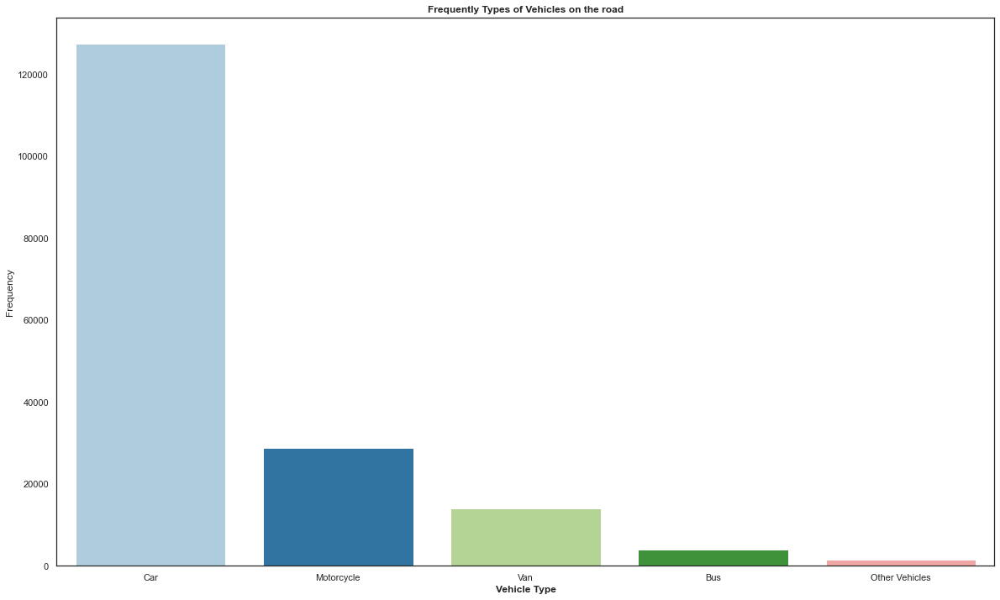

In [59]:
#Plotting a graph to show the frequently used type of vehicle on the road
sns.set(style="white", palette = 'Paired')
plt.figure(figsize=(20,12))
vehicle_plot = sns.countplot(x='Vehicle Class',data=accv)
plt.title('Frequently Types of Vehicles on the road',fontweight='bold' )
plt.xlabel("Vehicle Type", fontweight='bold')
plt.ylabel("Frequency")
plt.show()

>*(i)From the line chart above, vehicle type (cars) are more frequently involved in road traffic accidents with 127,538 occurences.*

__Engine Capacity__

In [60]:
#Group Engine_Capacity with Accident to get engine capacity involved in car accident
accv.groupby(['Engine_Capacity_(CC)'])['Accident_Index'].count().sort_values(ascending = False)

Engine_Capacity_(CC)
1849.0    46012
1598.0     9940
1968.0     5571
1995.0     5211
998.0      4922
          ...  
4611.0        1
4619.0        1
4633.0        1
1645.0        1
2.0           1
Name: Accident_Index, Length: 995, dtype: int64

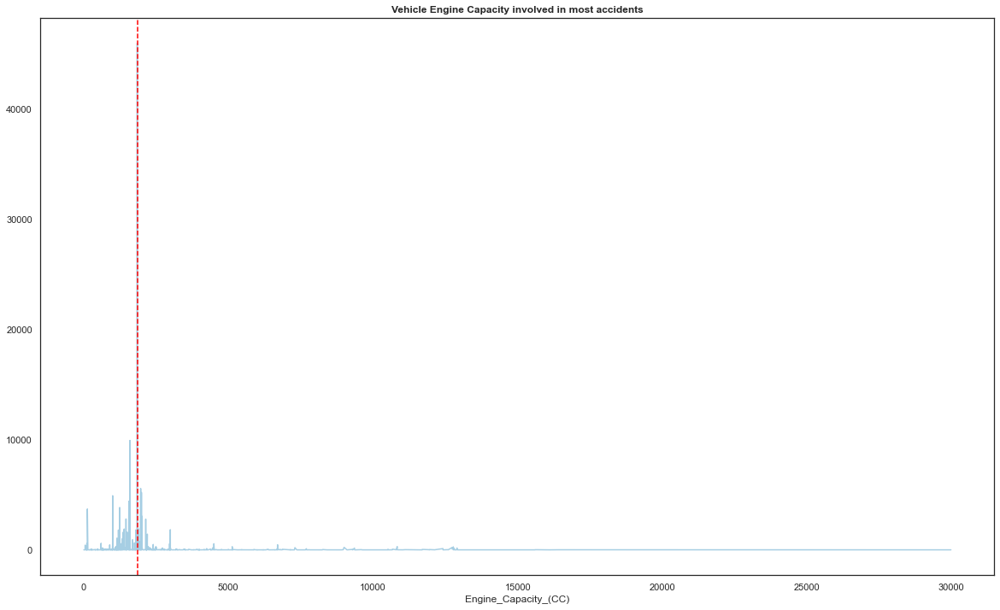

In [61]:
##plot the engine capacity with highest plot
accv.groupby(['Engine_Capacity_(CC)'])['Accident_Index'].count().plot(legend = False, figsize=(20,12))
plt.axvline(1849, color = 'red', ls = '--')
plt.title('Vehicle Engine Capacity involved in most accidents', fontweight='bold')
plt.show()

>*(ii)From the line chart above, Vehicles with Engine Capacity of 1849 which are more frequently involved in road accidents have 46,012 occurences.*

__Age of Vehicle__

In [62]:
##Age of Vehicle with Accident to get age of vehicle frequently involved in accident

accv.groupby(['Age_of_Vehicle'])['Accident_Index'].count().sort_values(ascending = False)

Age_of_Vehicle
8.0     58202
3.0      9964
1.0      9762
4.0      9690
2.0      9510
        ...  
61.0        1
56.0        1
49.0        1
48.0        1
94.0        1
Name: Accident_Index, Length: 72, dtype: int64

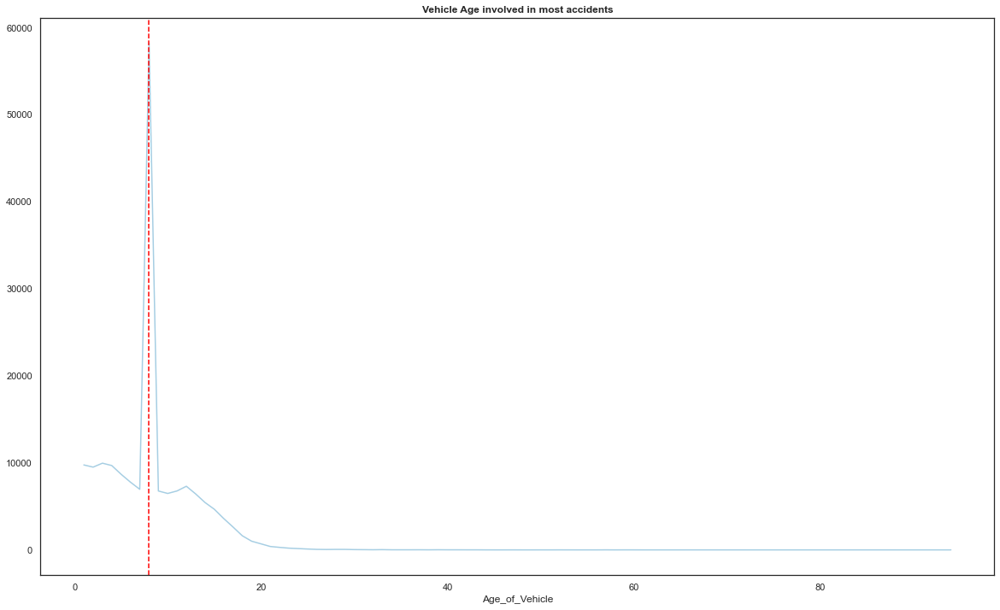

In [63]:
# ##Vehicle Age plot
accv.groupby(['Age_of_Vehicle'])['Accident_Index'].count().plot(legend = False, figsize=(20,12))
plt.axvline(8,color = 'red', ls = '--')
plt.title('Vehicle Age involved in most accidents', fontweight='bold')
plt.show()


>*(iii)From the line chart above, Vehicles aged 8years are more frequently involved in with 58,202 occurences.*

__Question G: Are there particular conditions (weather, geographic location, situations) that generate more road traffic accidents?__

In [64]:
# Rsda = rsda[rsda.Weather_Conditions != -1]
# Rsda = rsda[rsda.Road_Surface_Conditions != -1]
# Rsda = rsda[rsda.Light_Conditions != -1]
# Rsda = rsda[rsda.Special_Conditions_at_Site != -1]

In [65]:
conditions = rsda[['Light_Conditions','Weather_Conditions','Road_Surface_Conditions','Special_Conditions_at_Site','Accident_Severity']]
conditions['Accident_Severity'] = conditions['Accident_Severity'].replace([1,2,3], ['Fatal', 'Serious', 'Slight'])

__Light Conditions__

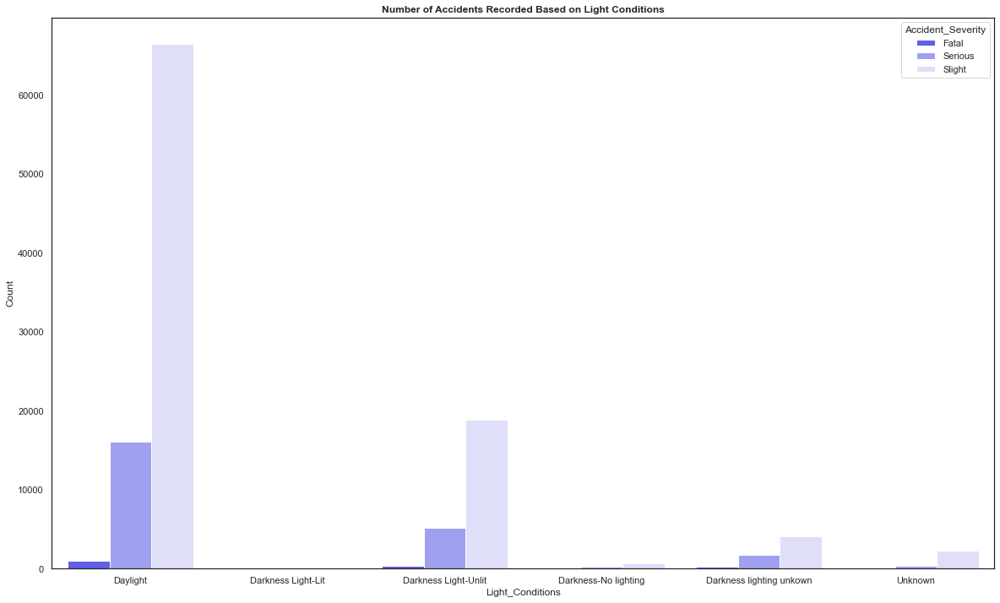

In [66]:
#plotting the chart for light conditions
sns.set(style="white", palette = 'bwr')
plt.figure(figsize=(20,12))
lightplot = sns.countplot(x='Light_Conditions',data=conditions, hue='Accident_Severity',hue_order=['Fatal', 'Serious', 'Slight'])
lightplot.set(xlabel='Light_Conditions', ylabel='Count',xticklabels=['Daylight', 'Darkness Light-Lit', 'Darkness Light-Unlit','Darkness-No lighting', 'Darkness lighting unkown', 'Unknown'])
plt.title('Number of Accidents Recorded Based on Light Conditions', fontweight='bold')
plt.show()

>*From the chart above, we can see that the UK records more accidents during daylight under light conditions perhaps people aren't conscious enough as other weathers although the accident severity is slight.*

__Weather Conditions__

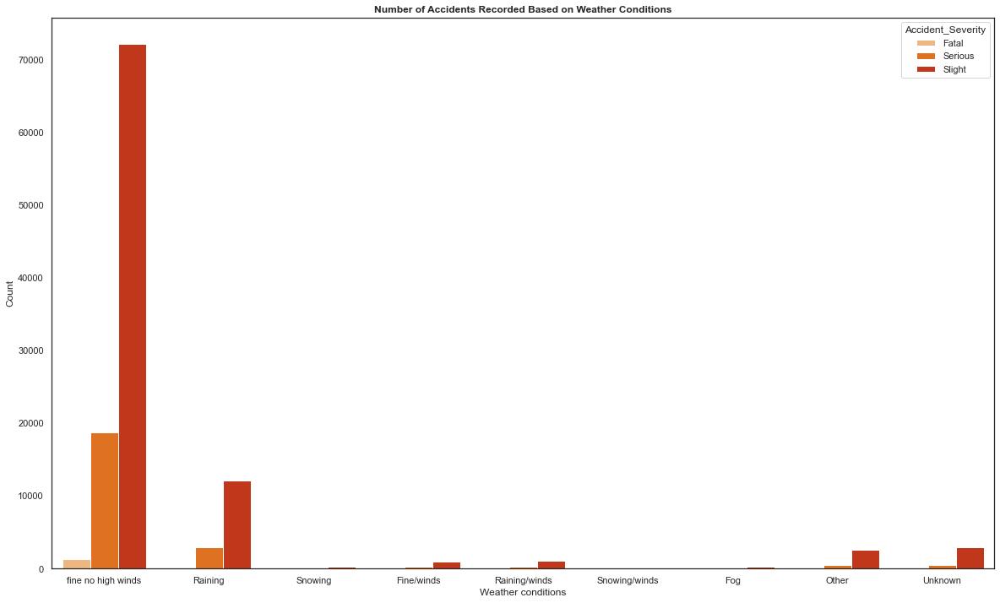

In [67]:
##plotting the chart for weather conditions

sns.set(style="white", palette = 'gist_heat_r')
plt.figure(figsize=(20,12))
weatherplot = sns.countplot(x='Weather_Conditions',data=conditions,hue='Accident_Severity',hue_order=['Fatal', 'Serious', 'Slight'],)
weatherplot.set(xlabel='Weather conditions', ylabel='Count',xticklabels=['fine no high winds','Raining','Snowing','Fine/winds',
                                                                         'Raining/winds','Snowing/winds','Fog','Other','Unknown'])
plt.title('Number of Accidents Recorded Based on Weather Conditions', fontweight='bold')
plt.show()

>*From the chart above, we can see that the UK records more accidents during fine no high winds under weather conditions perhaps people aren't conscious enough as other weathers although the accident severity is slight.*

__Road Surface Conditions__

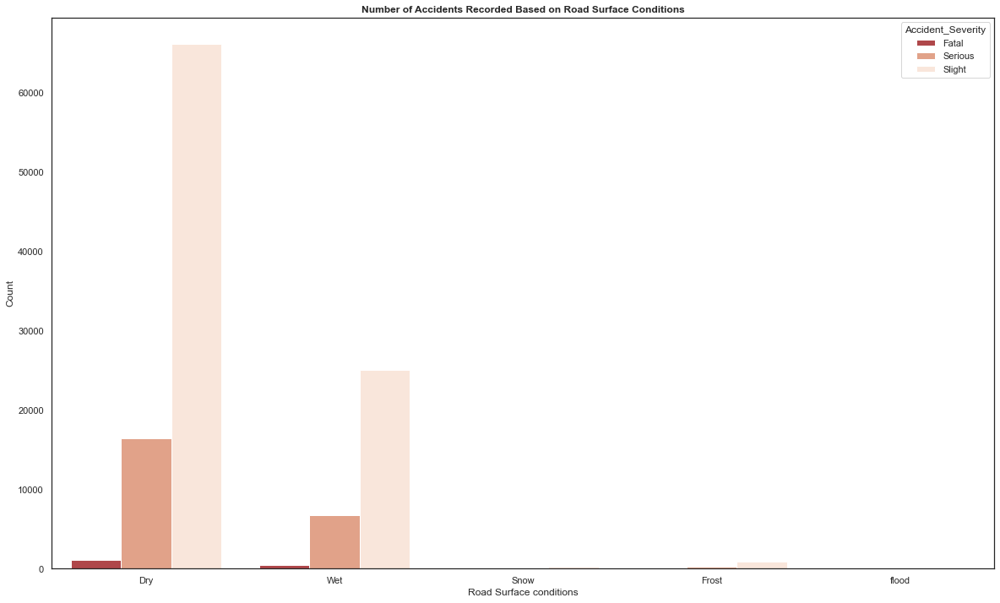

In [68]:
#plot for road surface condition
sns.set(style="white", palette = 'RdGy')
plt.figure(figsize=(20,12))
roadplot = sns.countplot(x='Road_Surface_Conditions',data=conditions,hue='Accident_Severity',hue_order=['Fatal', 'Serious', 'Slight'])
roadplot.set(xlabel='Road Surface conditions', ylabel='Count',xticklabels=['Dry','Wet','Snow','Frost','flood'])
plt.title('Number of Accidents Recorded Based on Road Surface Conditions', fontweight='bold')
plt.show()

>*From the chart above, we can see that the UK records more accidents when road surface is dry this could be because there are more cars on the road although the accident severity is slight.*

__Special Conditions At Site__

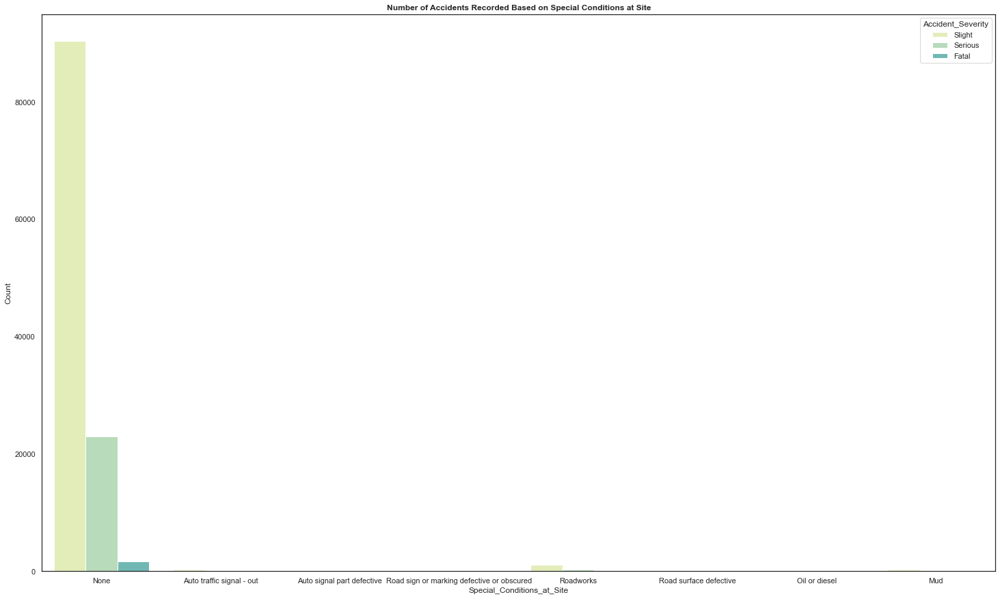

In [69]:
#Plot special conditions at site
sns.set(style="white", palette = 'YlGnBu')
plt.figure(figsize=(25,15))
roadplot = sns.countplot(x='Special_Conditions_at_Site',data=conditions,hue='Accident_Severity',hue_order=['Slight','Serious','Fatal'])
roadplot.set(xlabel='Special_Conditions_at_Site',ylabel='Count', xticklabels=['None','Auto traffic signal - out','Auto signal part defective','Road sign or marking defective or obscured','Roadworks', 'Road surface defective','Oil or diesel','Mud'])
plt.title('Number of Accidents Recorded Based on Special Conditions at Site', fontweight='bold')
plt.show()

>*From the chart above, we can see that the UK records more accidents when there are no special conditions at site.*

__Speed Limit__

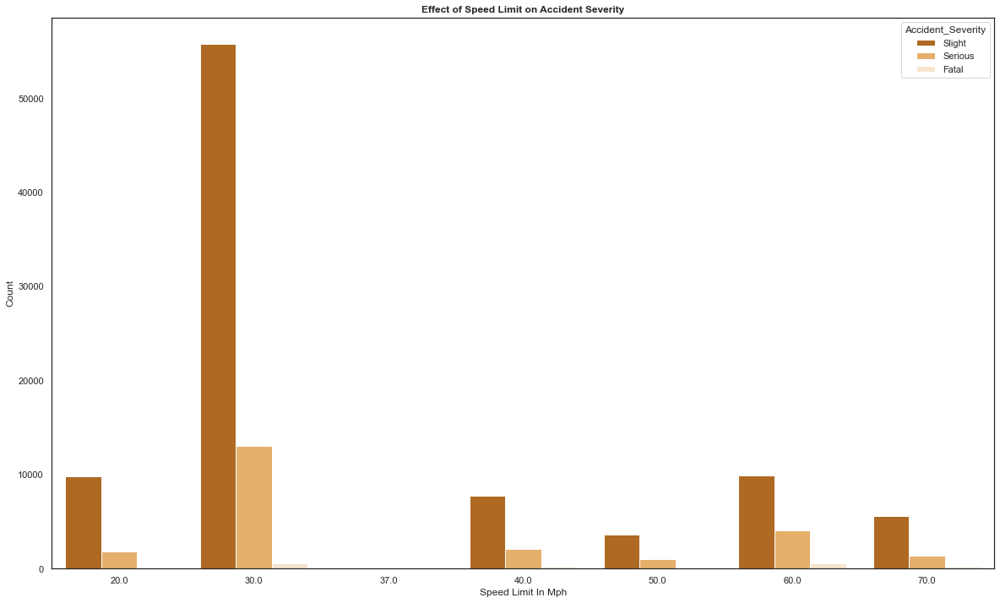

In [70]:
speed=rsda[rsda['Speed_limit']>=0]
speed['Accident_Severity'] = speed['Accident_Severity'].replace([1,2,3], ['Fatal','Serious', 'Slight'])
plt.figure(figsize=(20,12))
sns.set(style="white", palette = 'PuOr')
sp=sns.countplot(x= 'Speed_limit', hue='Accident_Severity', data=speed)
sp.set(xlabel='Speed Limit In Mph', ylabel = 'Count')
plt.title('Effect of Speed Limit on Accident Severity', fontweight='bold')    
plt.show()


>*The majority of collisions occur at 30 mph, which is the most prevalent speed limit on UK roadways. The national speed limit of 60 mph also sees a lot of accidents. Surprisingly, more deadly accidents occur at 30 mph than at 60 mph, demonstrating that speed isn't the primary determinant in major road accidents.*

__Vehicle Manoeuvre__

In [71]:
#Checking vehicle manoeuver value counts
rsdv['Vehicle_Manoeuvre'].value_counts().sort_values(ascending = False)

18.0    102086
9.0      19208
13.0     16841
4.0      13696
3.0      10738
5.0       9881
2.0       9137
7.0       6804
17.0      6555
16.0      5814
1.0       2948
10.0      2896
14.0      2047
12.0      1868
11.0      1717
6.0       1599
15.0      1486
8.0       1060
Name: Vehicle_Manoeuvre, dtype: int64

In [72]:
#dropping the ones with least value counts
manoeuvre = rsdv
manoeuvre = manoeuvre[manoeuvre.Vehicle_Manoeuvre != 8]
manoeuvre = manoeuvre[manoeuvre.Vehicle_Manoeuvre != 15]
manoeuvre = manoeuvre[manoeuvre.Vehicle_Manoeuvre != 6]
manoeuvre = manoeuvre[manoeuvre.Vehicle_Manoeuvre != 11]
manoeuvre = manoeuvre[manoeuvre.Vehicle_Manoeuvre != 12]
manoeuvre = manoeuvre[manoeuvre.Vehicle_Manoeuvre != 14]
manoeuvre = manoeuvre[manoeuvre.Vehicle_Manoeuvre != 1]
manoeuvre = manoeuvre[manoeuvre.Vehicle_Manoeuvre != 10]
manoeuvre = manoeuvre[manoeuvre.Vehicle_Manoeuvre != 13]

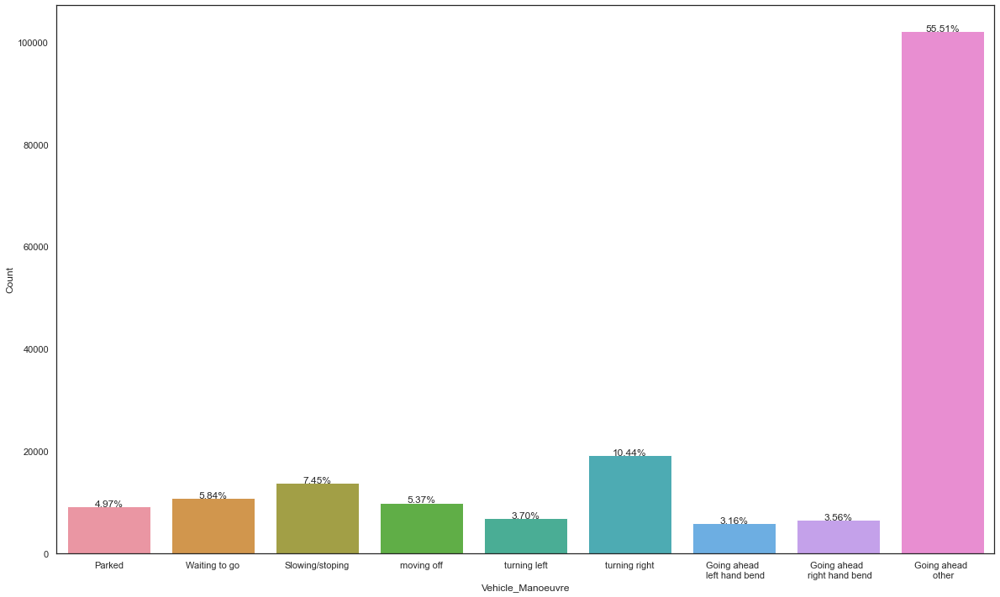

In [73]:
#Plot manoeuvre
plt.figure(figsize=(20,12))

manoplot = sns.countplot(x='Vehicle_Manoeuvre',data=manoeuvre)
manoplot.set(xlabel='Vehicle_Manoeuvre',ylabel='Count',xticklabels=['Parked','Waiting to go','Slowing/stoping','moving off','turning left','turning right','Going ahead \n left hand bend','Going ahead \n right hand bend','Going ahead \n other'])
for p in manoplot.patches: 
    height = p.get_height() 
    manoplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(manoeuvre))*100)+'%',  
      ha="center") 
plt.show()

 >*According to the chart above, going ahead others have a greater influence on the UK accident rate than others, possibly due to our inability to manoeuvre our vehicle in dangerous or emergency conditions while attempting to get ahead of others.*

__Road Type__

In [74]:
#Checking road type value counts
rsda['Road_Type'].value_counts().sort_values(ascending = False)

6    85320
3    18590
1     6880
2     2664
9     2143
7     1939
Name: Road_Type, dtype: int64

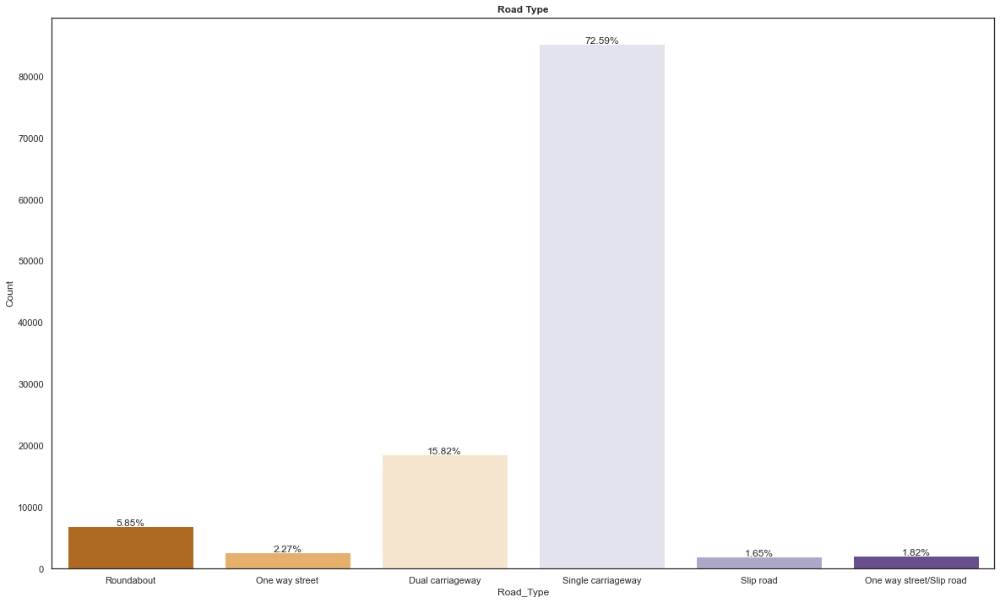

In [75]:
#plot
plt.figure(figsize=(20,12))
roadtypeplot = sns.countplot(x='Road_Type',data=rsda)
roadtypeplot.set(xlabel='Road_Type',ylabel='Count',xticklabels=['Roundabout','One way street', 'Dual carriageway','Single carriageway', 'Slip road','One way street/Slip road'])
for p in roadtypeplot.patches: 
    height = p.get_height() 
    roadtypeplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(rsda))*100)+'%',  
      ha="center") 
plt.title('Road Type', fontweight='bold')
plt.show()

 >*From the chat above, single carriageway has more accidents because it's a is a single continuous surface to the road, with no physical barrier separating the directions of travel.*

__Junction Control__

In [76]:
rsda.groupby(['Junction_Control'])['Accident_Index'].count().sort_values(ascending = False)

Junction_Control
4.0    103258
2.0     13122
3.0       773
1.0       379
0.0         4
Name: Accident_Index, dtype: int64

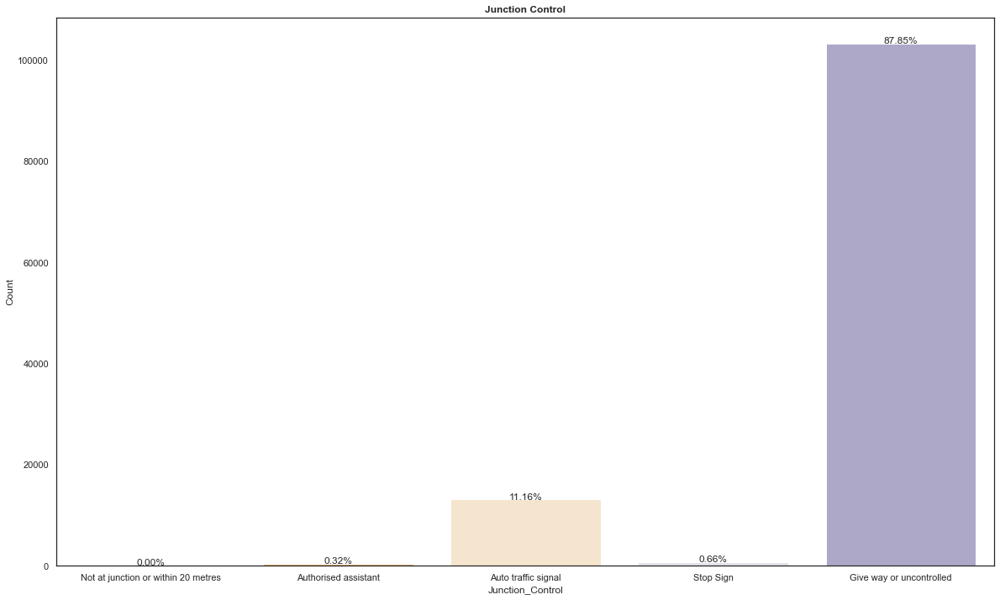

In [77]:
#plot
plt.figure(figsize=(20,12))
junctionplot = sns.countplot(x='Junction_Control',data=rsda)
junctionplot.set(xlabel='Junction_Control',ylabel='Count',xticklabels=['Not at junction or within 20 metres','Authorised assistant','Auto traffic signal','Stop Sign', 'Give way or uncontrolled'])
for p in junctionplot.patches: 
    height = p.get_height() 
    junctionplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(rsda))*100)+'%',  
      ha="center") 
plt.title('Junction Control', fontweight='bold')
plt.show()

>*Many give way junctions only have the white lines painted on the road. The warning sign and the triangle may or may not be present, Sometimes you have to look very closely to see which markings are present at a junction alot of times drivers dont see this which can lead to more accidents.*

__First Point of Impact__

In [78]:
rsdv['1st_Point_of_Impact'].value_counts()

1.0    107437
2.0     43344
3.0     28566
4.0     25293
0.0     11741
Name: 1st_Point_of_Impact, dtype: int64

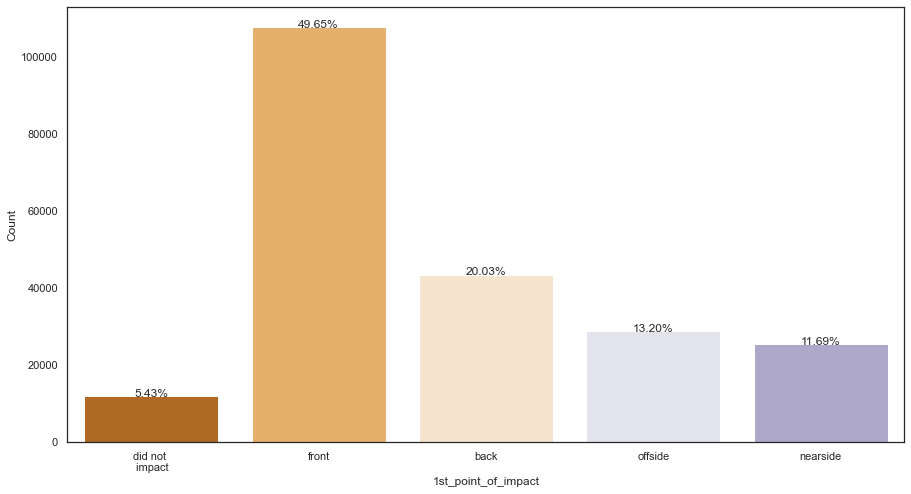

In [79]:
plt.figure(figsize=(15,8))

impactplot = sns.countplot(x='1st_Point_of_Impact',data=rsdv)
impactplot.set(xlabel='1st_point_of_impact',ylabel='Count',xticklabels=['did not \n impact','front','back','offside','nearside'])
for p in impactplot.patches: 
    height = p.get_height() 
    impactplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(rsdv))*100)+'%',  
      ha="center") 
plt.show()

__Police Attended The Scene__

In [80]:
rsda['Did_Police_Officer_Attend_Scene_of_Accident'].value_counts()

1    81309
2    26285
3     9942
Name: Did_Police_Officer_Attend_Scene_of_Accident, dtype: int64

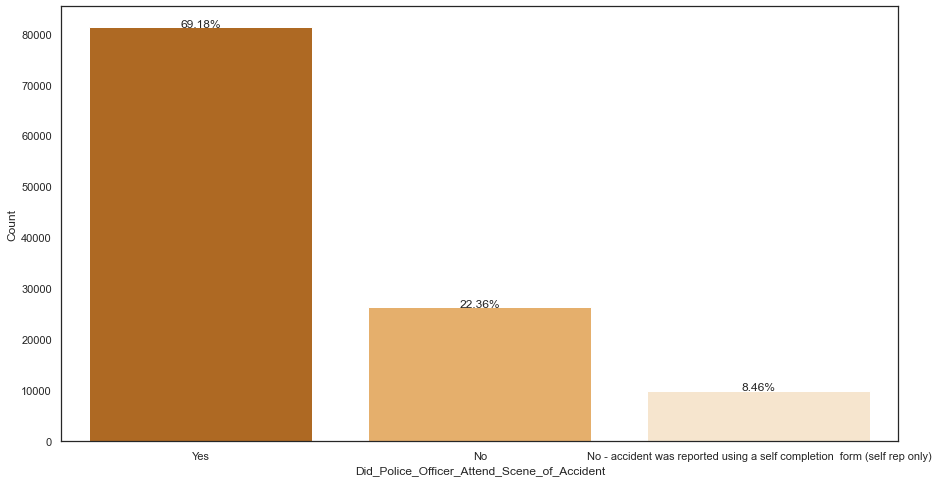

In [81]:
plt.figure(figsize=(15,8))

Police_Attendance = sns.countplot(x='Did_Police_Officer_Attend_Scene_of_Accident',data=rsda)
Police_Attendance.set(xlabel='Did_Police_Officer_Attend_Scene_of_Accident',ylabel='Count',xticklabels=['Yes', 'No','No - accident was reported using a self completion  form (self rep only)'])
for p in Police_Attendance.patches: 
    height = p.get_height() 
    Police_Attendance.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(rsda))*100)+'%',  
      ha="center") 
plt.show()

>*Above shows that Police Officer attends most accidents in Uk which shows how effective they are to curb any physical fight.*

__Rural and Urban Area__

In [82]:
rsda.groupby(['Urban_or_Rural_Area'])['Accident_Index'].count().sort_values(ascending = False)

Urban_or_Rural_Area
1    79533
2    37975
3       28
Name: Accident_Index, dtype: int64

posx and posy should be finite values
posx and posy should be finite values


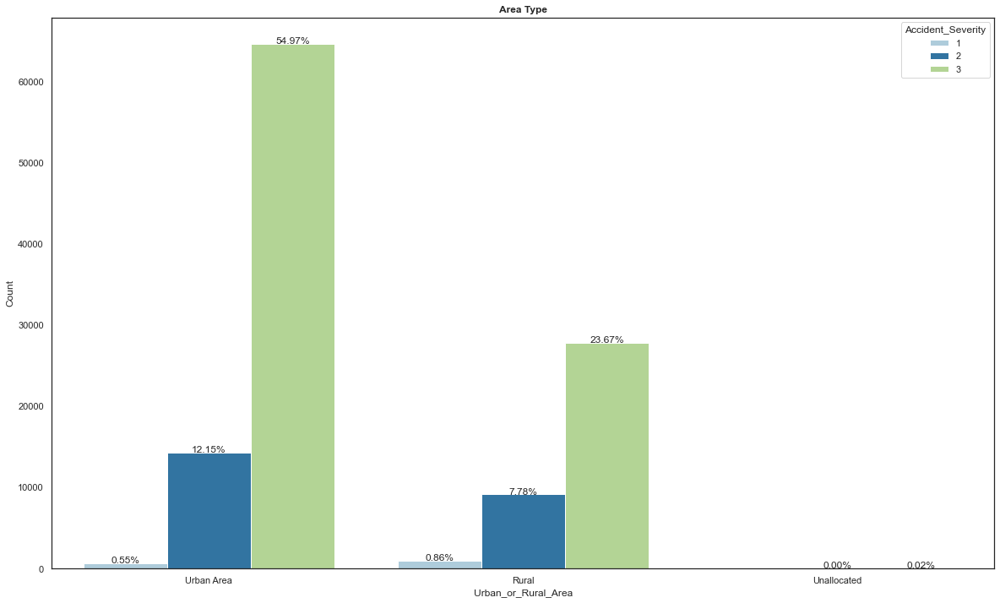

In [83]:
sns.set(style="white", palette = 'Paired')
plt.figure(figsize=(20,12))
areaplot = sns.countplot(x='Urban_or_Rural_Area',data=rsda,hue='Accident_Severity')
areaplot.set(xlabel='Urban_or_Rural_Area',ylabel='Count', xticklabels=['Urban Area', 'Rural', 'Unallocated'])
for p in areaplot.patches: 
    height = p.get_height() 
    areaplot.text(p.get_x()+p.get_width()/2., 
      height + 3, 
      '{:1.2f}'.format((height/len(rsda))*100)+'%',  
      ha="center") 
plt.title('Area Type', fontweight='bold')
plt.show()

>*In metropolitan areas, the number of serious and slight accident severity is higher, with 79,533 on urban roads and 37,975 on rural roads. These results reveal that while the number of incidents is larger in metropolitan areas, rural roads have a higher risk of fatalities, accounting for 7.78 percent of serious accidents.*

__K MEANS Clustering For Locations__

In [84]:
from sklearn.cluster import KMeans,OPTICS, DBSCAN
new_location = rsda[['Latitude','Longitude']]
flow =[]
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(new_location)
    flow.append(kmeanModel.inertia_)  

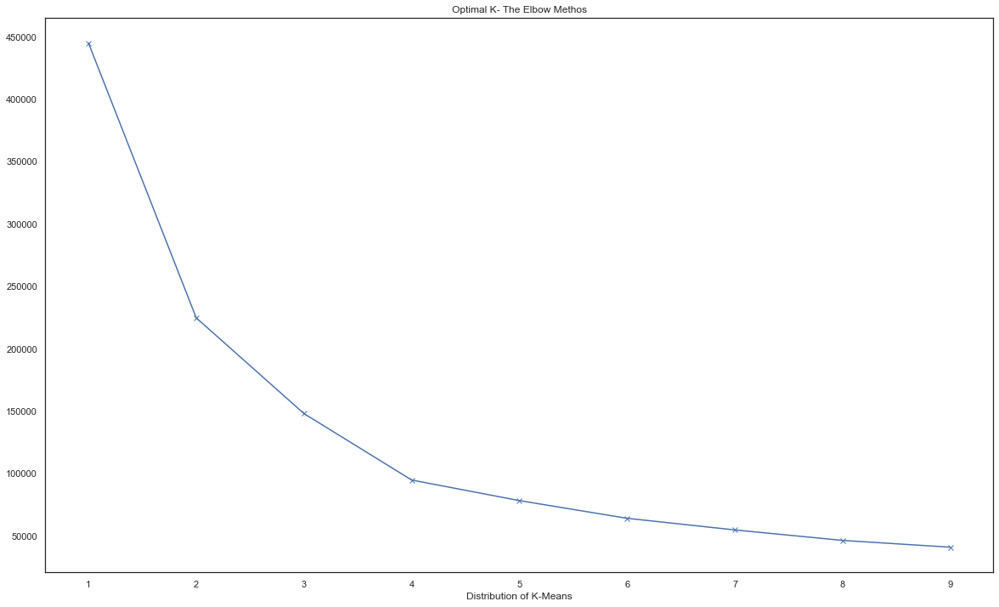

In [85]:
plt.figure(figsize=(20,12))
plt.plot(K, flow, 'bx-')
plt.xlabel('k')
plt.xlabel('Distribution of K-Means')
plt.title('Optimal K- The Elbow Methos')
plt.show()

In [86]:
new_location
kmeans = KMeans(n_clusters=4)
kmeans.fit(new_location)
labels = kmeans.fit_predict(new_location)
centroids = kmeans.cluster_centers_
centroids

array([[51.56309971, -0.11738147],
       [55.98346195, -3.70373385],
       [51.2801992 , -3.11519513],
       [53.38911604, -1.79474298]])

In [87]:
centroids=kmeanModel.cluster_centers_
new_location = np.round(new_location, decimals=2) #round coordinates to 2 decimal places
new_location = new_location.groupby(['Longitude', 'Latitude']).size().reset_index(name='counts') #group same coordinates together
print(new_location) #show data

       Longitude  Latitude  counts
0          -7.53     56.94       1
1          -7.39     57.46       1
2          -7.38     57.25       1
3          -7.28     57.64       1
4          -7.27     57.50       1
...          ...       ...     ...
38666       1.75     52.47      10
38667       1.75     52.48      11
38668       1.75     52.49      10
38669       1.76     52.48       3
38670       1.76     52.49       3

[38671 rows x 3 columns]


In [88]:
fig = px.density_mapbox(new_location, lat = 'Latitude', lon = 'Longitude',
                        radius =10, center = dict(lat=9, lon=9), zoom =2, 
                        mapbox_style = 'open-street-map', 
                        title = 'Accident Location')
fig.show()

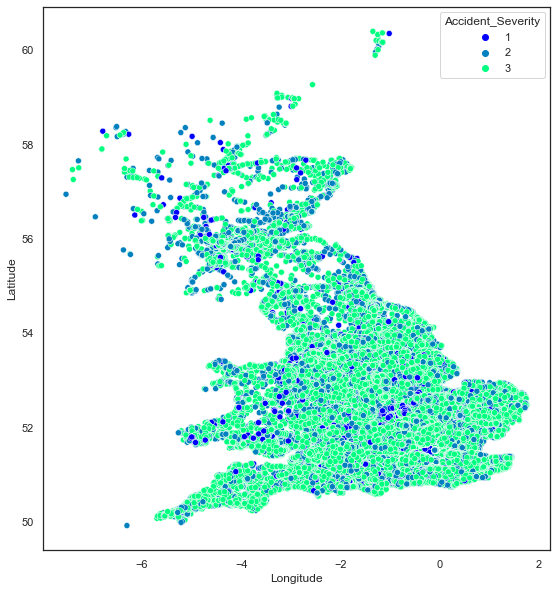

In [89]:
plt.figure(figsize = (20,10))
plt.subplot(1,2,2)
sns.scatterplot(data=rsda, x = "Longitude", y = "Latitude", hue = "Accident_Severity", palette = "winter")
plt.show()

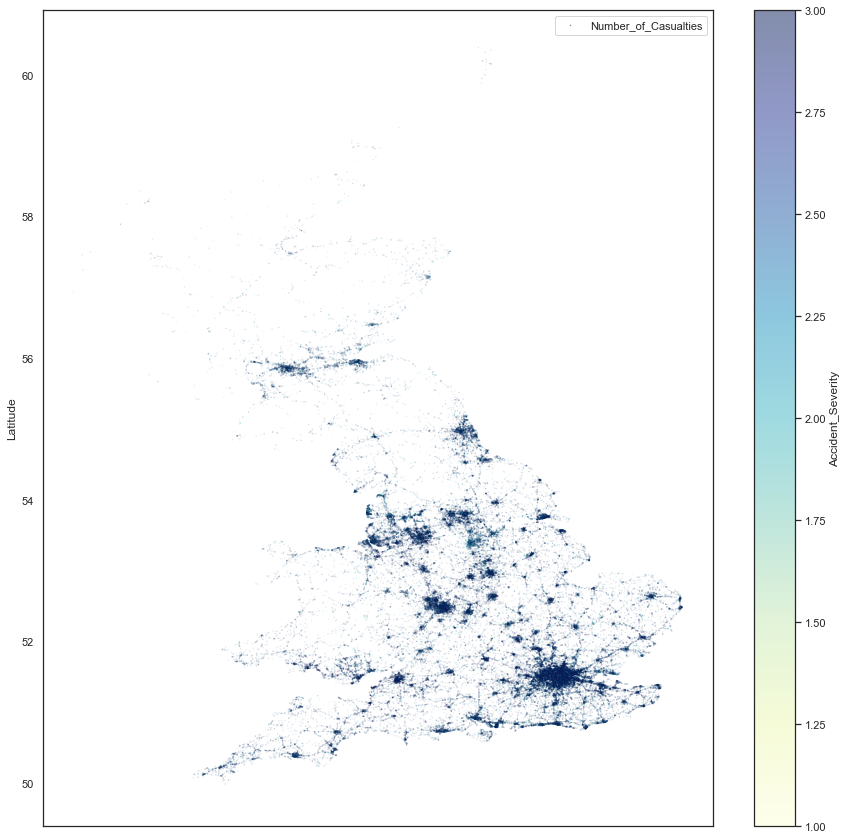

In [90]:
rsda.plot(kind = "scatter", x = "Longitude", y = "Latitude", alpha = 0.5,
             s = rsda["Number_of_Casualties"]/100, label = "Number_of_Casualties", figsize=(15,15),
             c = "Accident_Severity", cmap = plt.get_cmap("YlGnBu"), colorbar= True
             )
plt.legend()
plt.show()

__Question H: How does driver related variables affect the outcome (e.g., age of the driver, and the purpose of the journey)?__

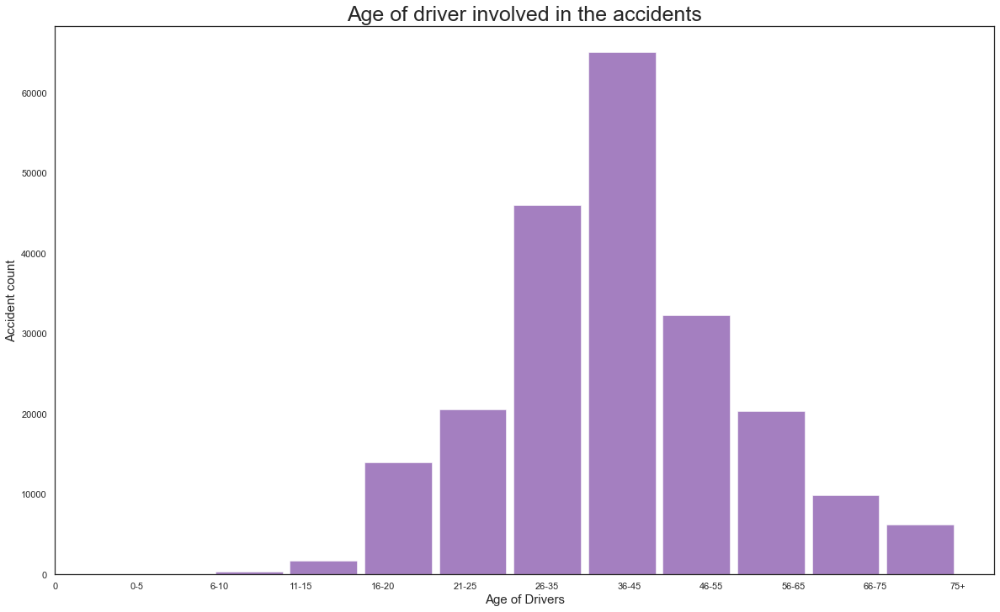

In [91]:
objects = ['0','0-5','6-10','11-15','16-20','21-25','26-35',
          '36-45', '46-55','56-65','66-75','75+']

plt.figure(figsize=(20,12))
rsdv.Age_Band_of_Driver.hist(bins = 11,alpha=0.5,rwidth=0.90, color= 'indigo',)
plt.title('Age of driver involved in the accidents', fontsize = 25)
plt.grid(False)
y_pos = np.arange(len(objects))
plt.xticks(y_pos , objects)
plt.ylabel('Accident count' , fontsize = 15)
plt.xlabel('Age of Drivers', fontsize = 15,)
plt.show()

>*From the chart above, drivers who fall within the age band of (36-45years) have the most frequency of road accidents in the UK, You can start driving a car when you’re 17 according https://www.gov.uk/driving-lessons-learning-to-drive however we have age band 6-10 and 11-15 we can assume they were probably driving other type of vehicle e.g Pedal Cycle.*

__Purpose of Journey__

In [92]:
#grouping Journey as part of work and Commuting to/from work as work related
#grouping Taking pupil to/from school and Pupil riding to/from school as school related
#grouping other and not known to other purposes
def purpose_of_journey(row):
    if row['Journey_Purpose_of_Driver']== 1 or row['Journey_Purpose_of_Driver']== 2:
        return 'Work Related'
    if row['Journey_Purpose_of_Driver']== 3 or row['Journey_Purpose_of_Driver']== 4:
        return 'School Related'
    else:
        return 'Other Purposes'

In [93]:
rsdv['Journey Purpose']= rsdv.apply(purpose_of_journey, axis = 1)

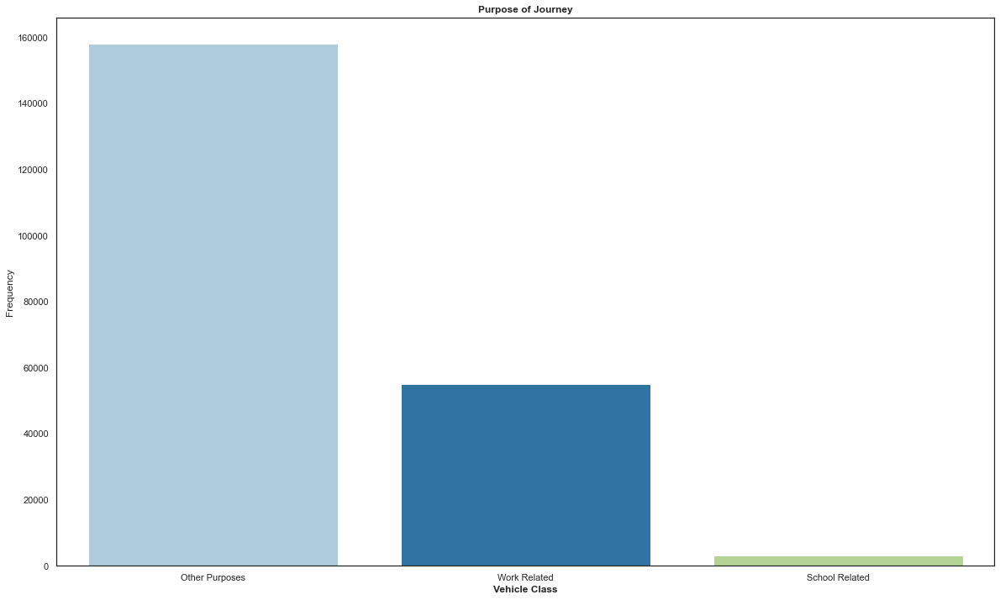

In [94]:
#plot
sns.set(style="white", palette = 'Paired')
plt.figure(figsize=(20,12))
vehicle_plot = sns.countplot(x='Journey Purpose',data=rsdv)
plt.title('Purpose of Journey',fontweight='bold' )
plt.xlabel("Vehicle Class", fontweight='bold')
plt.ylabel("Frequency")
plt.show()

>*ii) From the chart above the reason for embarking on the journey was unknown.*

__Sex of Driver__

In [95]:
rsdv.groupby(['Sex_of_Driver'])['Accident_Index'].count().sort_values(ascending = False)

Sex_of_Driver
1.0    134593
2.0     58384
3.0     23404
Name: Accident_Index, dtype: int64

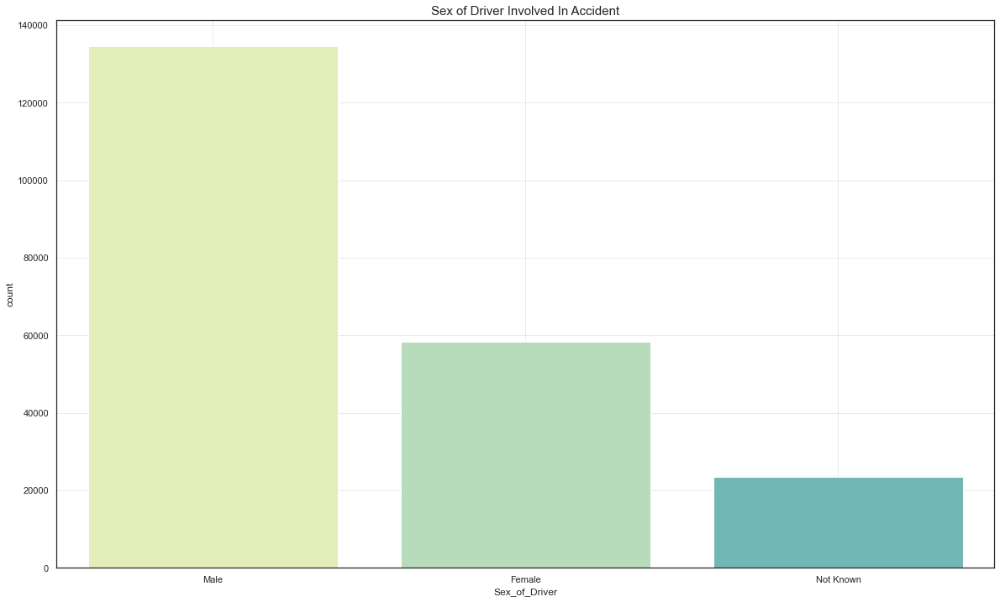

In [96]:
sns.set(style="white", palette = 'YlGnBu')
plt.figure(figsize=(20,12))
ax=sns.countplot(rsdv['Sex_of_Driver'])
plt.title('Sex of Driver Involved In Accident', fontsize=15)
ax.set_xticklabels(['Male','Female','Not Known'])
plt.grid(alpha=0.4)

>*There are more Male involved driver involved in accident compare to Female in UK.*

## __Data Preparation__

The goal here is to get the data ready for modelling.
Because most machine learning models cannot handle input in its raw text form, categorical variables must be converted to numeric form. 

__Question I: Can we make predictions about when and where accidents will occur, and the severity of the 
injuries sustained from the data supplied to improve road safety? How well do our models 
compare to government models?__

In [97]:
#Merging the vehicle, casualty and accident data
vc = pd.merge(rsdv, rsdc, on = ['Accident_Index', 'Vehicle_Reference'], how = 'inner')
avc = pd.merge(rsda, vc, on = ['Accident_Index'], how = 'inner')

In [98]:
avc.shape

(109518, 78)

In [99]:
avc1 = avc.copy() #creating a copy of avc data to be used for latitude prediction
avc2 = avc.copy() #creating a copy of avc data to be used for latitude prediction
avc3 = avc.copy() #creating a copy of avc data to be used for accident severity prediction
avc4 = avc.copy() #creating a copy of avc data to be used for comparing ajusted serious model with that of the government

Feature Selection

In [100]:
drop_col = avc.select_dtypes('object').columns

In [101]:
### dropping the object features in the data because we don't want to expand the number of columns in the data so as to reduce the effect of curse of dimensionality which would happen if we one-hot encode the categorical features.
avc = avc.drop(drop_col, axis=1)

###dropping the date column in the data because we have already split date into month, week and day
avc.drop(['date', 'Decimal_Time', 'Date_time'], axis = 1, inplace = True)

In [102]:
avc.head()

,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Day_of_Week,Local_Authority_(District),1st_Road_Class,1st_Road_Number,Road_Type,Speed_limit,Junction_Detail,Junction_Control,2nd_Road_Class,2nd_Road_Number,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,Day,Week,Hour,Vehicle_Reference,Vehicle_Type,Towing_and_Articulation,Vehicle_Manoeuvre,Vehicle_Location-Restricted_Lane,Junction_Location,Skidding_and_Overturning,Hit_Object_in_Carriageway,Vehicle_Leaving_Carriageway,Hit_Object_off_Carriageway,1st_Point_of_Impact,Was_Vehicle_Left_Hand_Drive?,Journey_Purpose_of_Driver,Sex_of_Driver,Age_of_Driver,Age_Band_of_Driver,Engine_Capacity_(CC),Propulsion_Code,Age_of_Vehicle,Driver_IMD_Decile,Driver_Home_Area_Type,Vehicle_IMD_Decile,Casualty_Reference,Casualty_Class,Sex_of_Casualty,Age_of_Casualty,Age_Band_of_Casualty,Casualty_Severity,Pedestrian_Location,Pedestrian_Movement,Car_Passenger,Bus_or_Coach_Passenger,Pedestrian_Road_Maintenance_Worker,Casualty_Type,Casualty_Home_Area_Type,Casualty_IMD_Decile
0,528218.0,180407.0,-0.153842,51.508057,1,3,2,3,2,1,3,4202,1,30.0,1.0,2.0,3.0,4202.0,0.0,5.0,1.0,1,1.0,0.0,0.0,1,3,18,8,17,1,9.0,0.0,13.0,0.0,2.0,0.0,0.0,0.0,0.0,4.0,1.0,6.0,1.0,58.0,9.0,1849.0,2.0,8.0,2.0,1.0,2.0,1,1,1.0,58.0,9.0,3,0.0,0,0.0,0.0,0.0,9.0,1.0,2.0
1,528218.0,180407.0,-0.153842,51.508057,1,3,2,3,2,1,3,4202,1,30.0,1.0,2.0,3.0,4202.0,0.0,5.0,1.0,1,1.0,0.0,0.0,1,3,18,8,17,1,9.0,0.0,13.0,0.0,2.0,0.0,0.0,0.0,0.0,4.0,1.0,6.0,1.0,58.0,9.0,1849.0,2.0,8.0,2.0,1.0,2.0,2,2,2.0,38.0,6.0,3,0.0,0,1.0,0.0,0.0,9.0,1.0,5.0
2,528218.0,180407.0,-0.153842,51.508057,1,3,2,3,2,1,3,4202,1,30.0,1.0,2.0,3.0,4202.0,0.0,5.0,1.0,1,1.0,0.0,0.0,1,3,18,8,17,1,9.0,0.0,13.0,0.0,2.0,0.0,0.0,0.0,0.0,4.0,1.0,6.0,1.0,58.0,9.0,1849.0,2.0,8.0,2.0,1.0,2.0,3,2,2.0,38.0,6.0,3,0.0,0,2.0,0.0,0.0,9.0,1.0,5.0
3,530219.0,172463.0,-0.127949,51.436208,1,3,2,1,3,9,3,23,2,30.0,0.0,4.0,5.0,0.0,0.0,1.0,4.0,1,1.0,0.0,0.0,1,3,15,3,21,1,9.0,0.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,6.0,2.0,24.0,5.0,1849.0,2.0,8.0,3.0,1.0,3.0,1,1,2.0,24.0,5.0,3,0.0,0,0.0,0.0,0.0,9.0,1.0,3.0
4,530222.0,182543.0,-0.124193,51.526795,1,3,2,1,3,2,4,504,6,30.0,3.0,4.0,6.0,0.0,0.0,0.0,4.0,1,1.0,0.0,0.0,1,1,1,1,1,2,1.0,0.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,33.0,6.0,1849.0,2.0,8.0,5.0,1.0,5.0,1,2,2.0,21.0,5.0,3,0.0,0,0.0,0.0,0.0,1.0,1.0,1.0


In [103]:
avc.shape


(109518, 66)

>*From the EDA, accidents occur mostly during the 17th hour and least during 4th hour. Here will be predicting accident hour based on Hour(Acc_Hour) variable using a regression model.*

## Pre-Model Building

In [104]:
X = avc.drop('Hour', axis=1) #features
y = avc['Hour'] ##target variable

In [105]:
# Split the data into 30% test and 70% training
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100)

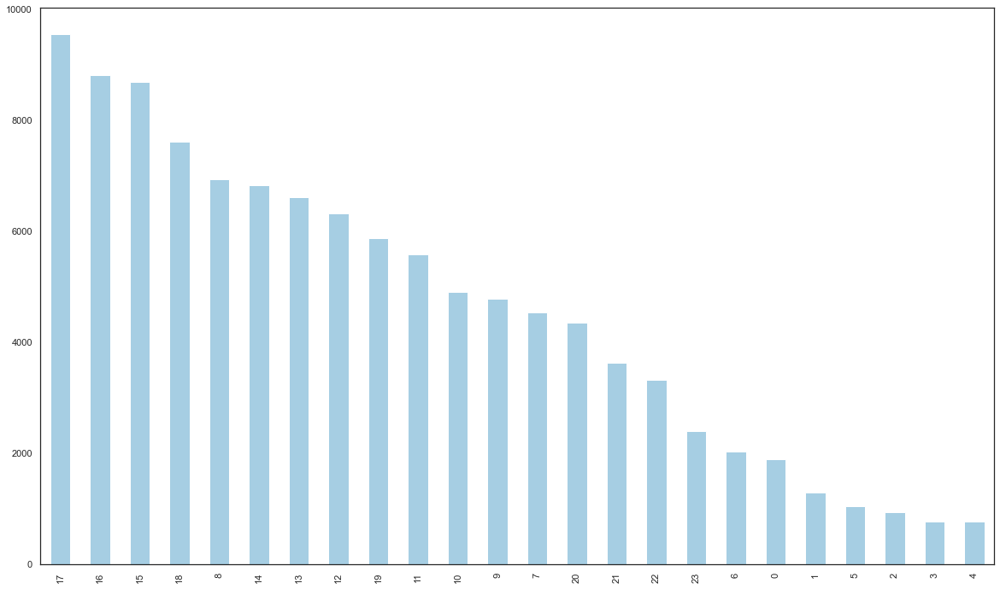

In [106]:
sns.set(style="white", palette = 'Paired')
plt.figure(figsize=(20,12))
avc['Hour'].value_counts().plot(kind='bar')
plt.show()

## Handling Imbalance data

 - Oversampling the minority class instances is one technique to overcome the problem of data imbalance.This can be accomplished by simply duplicating minority class samples in the training dataset before fitting a model.This can help to balance the class distribution, but it gives the model no more information. 
 - To balance the data, we'll apply the Synthetic Minority Over-Sampling Technique (SMOTE). SMOTE works by picking instances in the feature space that are close together, drawing a line between them in the feature space, and drawing a new sample at a location along that line.

In [107]:
from collections import Counter
import imblearn
from imblearn.over_sampling import SMOTE
smote = SMOTE()

# fit predictor and target variable
X_smote, y_smote = smote.fit_resample(X_train, y_train)

print('Original dataset shape', len(y_train))
print('Resampled dataset shape', len(y_smote))

# features_smote, target_smote = smote.fit_resample(features, target)


print("Resampled target shape: {}".format(Counter(y_smote)))

Original dataset shape 76662
Resampled dataset shape 161808
Resampled target shape: Counter({9: 6742, 16: 6742, 13: 6742, 8: 6742, 12: 6742, 14: 6742, 23: 6742, 17: 6742, 19: 6742, 0: 6742, 21: 6742, 18: 6742, 11: 6742, 15: 6742, 10: 6742, 7: 6742, 20: 6742, 6: 6742, 5: 6742, 4: 6742, 1: 6742, 22: 6742, 2: 6742, 3: 6742})


In [108]:
print('Original dataset shape', len(X_train))
print('Resampled dataset shape', len(X_smote))

Original dataset shape 76662
Resampled dataset shape 161808


In [109]:
len(X_smote)

161808

In [110]:
len(y_smote)

161808

Our Data is Balanced!!!

In [111]:
model= CatBoostRegressor(eval_metric='MAE') 

In [112]:
model.fit(X_smote,y_smote,eval_set=[(X_smote,y_smote),(X_test, y_test)])

Learning rate set to 0.113164
0:	learn: 5.9130315	test: 5.9130315	test1: 4.6827830	best: 4.6827830 (0)	total: 211ms	remaining: 3m 30s
1:	learn: 5.8327207	test: 5.8327207	test1: 4.6220911	best: 4.6220911 (1)	total: 261ms	remaining: 2m 10s
2:	learn: 5.7645327	test: 5.7645327	test1: 4.5707338	best: 4.5707338 (2)	total: 312ms	remaining: 1m 43s
3:	learn: 5.7012169	test: 5.7012169	test1: 4.5219756	best: 4.5219756 (3)	total: 361ms	remaining: 1m 29s
4:	learn: 5.6474417	test: 5.6474417	test1: 4.4857750	best: 4.4857750 (4)	total: 410ms	remaining: 1m 21s
5:	learn: 5.6001283	test: 5.6001283	test1: 4.4512983	best: 4.4512983 (5)	total: 464ms	remaining: 1m 16s
6:	learn: 5.5588521	test: 5.5588521	test1: 4.4211731	best: 4.4211731 (6)	total: 514ms	remaining: 1m 12s
7:	learn: 5.5223689	test: 5.5223689	test1: 4.3936637	best: 4.3936637 (7)	total: 568ms	remaining: 1m 10s
8:	learn: 5.4903709	test: 5.4903709	test1: 4.3670039	best: 4.3670039 (8)	total: 614ms	remaining: 1m 7s
9:	learn: 5.4635414	test: 5.4635414

In [113]:
y_pred=model.predict(X_test)

In [114]:
##Evaluation metric
print(mean_absolute_error(y_test, y_pred)) 

3.7022921692962836


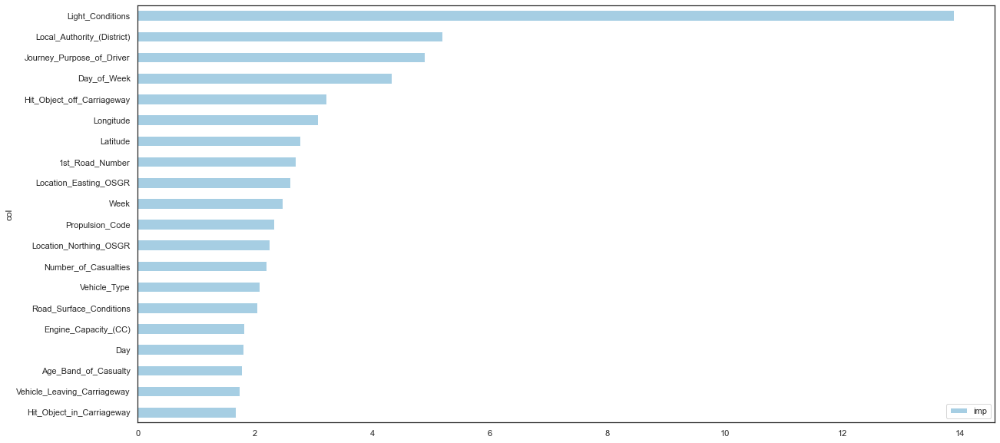

In [115]:
feature_importance = pd.DataFrame({'imp':model.feature_importances_, 'col': X.columns})
feature_importance = feature_importance.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-20:]
top_20_features = feature_importance.plot(kind='barh', x='col', y='imp', figsize=(20, 10))

>*The light conditions is the most important feature that predicts the hour an accident will occur.*

## Predicting where accidents will occur (Latitude)

Feature Selection

In [116]:
drop_col = avc1.select_dtypes('object').columns

In [117]:
### dropping the object features in the data because we don't want to expand the number of columns in the data so as to reduce the effect of curse of dimensionality which would happen if we one-hot encode the categorical features.
avc1 = avc1.drop(drop_col, axis=1)

###dropping the date column in the data because we have already split date into month, week and day. We also drop Longitude, Location_Easting_OSGR and Location_Northing_OSGR to avoid data leakage in our model.
avc1.drop(['date', 'Date_time', 'Decimal_Time', 'Longitude', 'Location_Easting_OSGR', 'Location_Northing_OSGR'], axis = 1, inplace = True)

In [118]:
X = avc1.drop('Latitude', axis=1) #predictors
y = avc1['Latitude'] #target variable

In [119]:
# Split the data into 30% test and 70% training
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [120]:
model = LGBMRegressor(reg_alpha=10, reg_lambda=10)  #we train our model with LGBMRegressor and we specify few parameters

In [121]:
model.fit(X_train,y_train,eval_set=[(X_train,y_train),(X_test, y_test)])

[1]	training's l2: 1.59487	valid_1's l2: 1.60265
[2]	training's l2: 1.29867	valid_1's l2: 1.30452
[3]	training's l2: 1.05829	valid_1's l2: 1.06294
[4]	training's l2: 0.863209	valid_1's l2: 0.866555
[5]	training's l2: 0.704911	valid_1's l2: 0.707562
[6]	training's l2: 0.576352	valid_1's l2: 0.578085
[7]	training's l2: 0.472036	valid_1's l2: 0.473294
[8]	training's l2: 0.38725	valid_1's l2: 0.387911
[9]	training's l2: 0.318391	valid_1's l2: 0.318669
[10]	training's l2: 0.262432	valid_1's l2: 0.26236
[11]	training's l2: 0.216964	valid_1's l2: 0.216681
[12]	training's l2: 0.18002	valid_1's l2: 0.179519
[13]	training's l2: 0.149949	valid_1's l2: 0.149337
[14]	training's l2: 0.125426	valid_1's l2: 0.124678
[15]	training's l2: 0.105461	valid_1's l2: 0.104622
[16]	training's l2: 0.0891603	valid_1's l2: 0.0882554
[17]	training's l2: 0.0758999	valid_1's l2: 0.0749466
[18]	training's l2: 0.0651092	valid_1's l2: 0.0641176
[19]	training's l2: 0.0559703	valid_1's l2: 0.0549686
[20]	training's l2: 0.

LGBMRegressor(reg_alpha=10, reg_lambda=10)

In [122]:
y_pred_lat=model.predict(X_test) #Prediction

In [123]:
print(mean_absolute_error(y_test, y_pred_lat))  ##Evaluation metric

0.05890946336637303


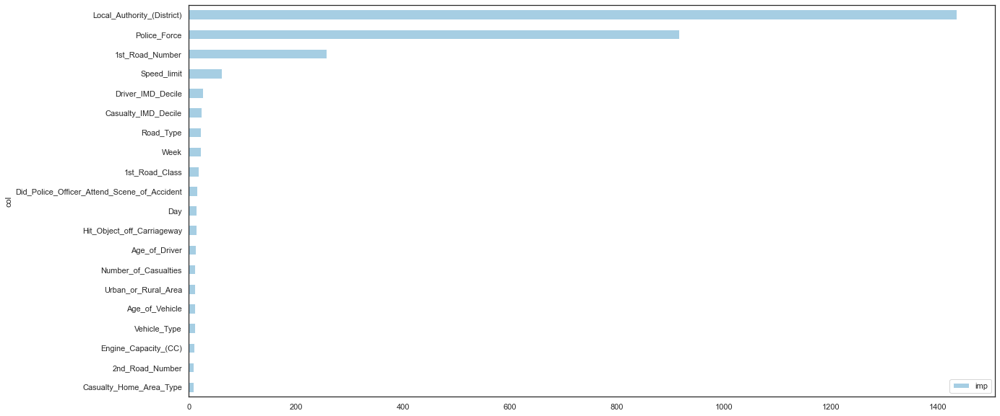

In [124]:
fea_imp = pd.DataFrame({'imp':model.feature_importances_, 'col': X.columns})
fea_imp = fea_imp.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-20:]
_ = fea_imp.plot(kind='barh', x='col', y='imp', figsize=(20, 10))
plt.savefig('Catboost_feature_importance.png')   

>*The Local_Authority_(District) is the most important feature for predicting the latitude of where an accident will occur.*

In [125]:
#turn our predictions to a dataframe
y_pred_lat_loc = pd.DataFrame(y_pred_lat, columns = ['Latitude'])
y_pred_lat_loc['index_column'] = y_pred_lat_loc.index

In [126]:
y_pred_lat_loc

,Latitude,index_column
0,51.045437,0
1,55.964633,1
2,51.251641,2
3,52.395060,3
4,53.754715,4
...,...,...
32851,52.635517,32851
32852,56.472226,32852
32853,53.778274,32853
32854,53.488707,32854


## Predicting where accident will occur (Longitude)

In [127]:
drop_col = avc2.select_dtypes('object').columns

In [128]:
### dropping the object features in the data because we don't want to expand the number of columns in the data so as to reduce the effect of curse of dimensionality which would happen if we one-hot encode the categorical features.
avc2 = avc2.drop(drop_col, axis=1)

###dropping the date column in the data because we have already split date into month, week and day. We also drop Longitude, Location_Easting_OSGR and Location_Northing_OSGR to avoid data leakage in our model.
avc2.drop(['date', 'Date_time', 'Decimal_Time', 'Latitude', 'Location_Easting_OSGR', 'Location_Northing_OSGR'], axis = 1, inplace = True)

In [129]:
X = avc2.drop('Longitude', axis=1) #predictors
y = avc2['Longitude'] #target variable

In [130]:
# Split the data into 30% test and 70% training
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [131]:
model= LGBMRegressor(reg_alpha=10, reg_lambda=10)

In [132]:
model.fit(X_train,y_train,eval_set=[(X_train,y_train),(X_test, y_test)])

[1]	training's l2: 1.30873	valid_1's l2: 1.30205
[2]	training's l2: 1.07403	valid_1's l2: 1.06787
[3]	training's l2: 0.883406	valid_1's l2: 0.877394
[4]	training's l2: 0.728175	valid_1's l2: 0.722621
[5]	training's l2: 0.602471	valid_1's l2: 0.597179
[6]	training's l2: 0.500179	valid_1's l2: 0.495075
[7]	training's l2: 0.416706	valid_1's l2: 0.411848
[8]	training's l2: 0.349036	valid_1's l2: 0.344435
[9]	training's l2: 0.293536	valid_1's l2: 0.28919
[10]	training's l2: 0.248542	valid_1's l2: 0.244414
[11]	training's l2: 0.211486	valid_1's l2: 0.207747
[12]	training's l2: 0.181174	valid_1's l2: 0.177813
[13]	training's l2: 0.156146	valid_1's l2: 0.153084
[14]	training's l2: 0.135206	valid_1's l2: 0.132372
[15]	training's l2: 0.118283	valid_1's l2: 0.115631
[16]	training's l2: 0.104089	valid_1's l2: 0.101669
[17]	training's l2: 0.0926447	valid_1's l2: 0.0903748
[18]	training's l2: 0.082959	valid_1's l2: 0.0808503
[19]	training's l2: 0.0749349	valid_1's l2: 0.0729042
[20]	training's l2: 0

LGBMRegressor(reg_alpha=10, reg_lambda=10)

In [133]:
y_pred_lat=model.predict(X_test)

In [134]:
print(mean_absolute_error(y_test, y_pred_lat))

0.0929792993125734


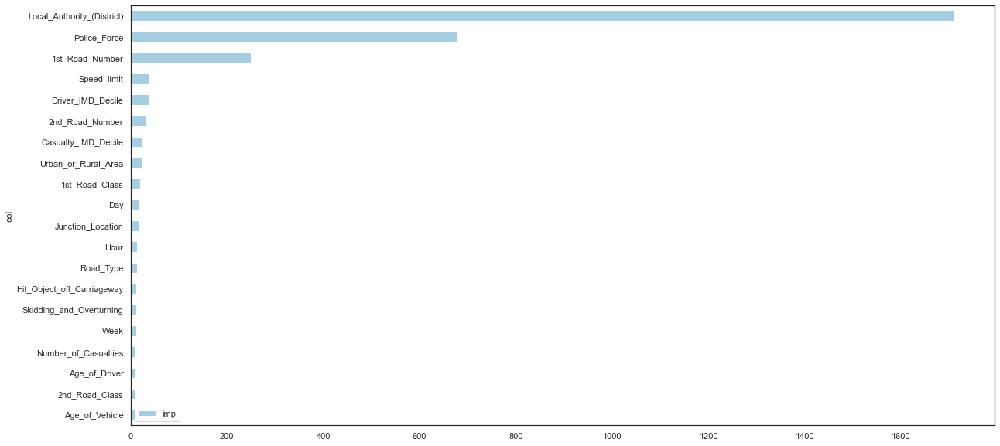

In [135]:
fea_imp = pd.DataFrame({'imp':model.feature_importances_, 'col': X.columns})
fea_imp = fea_imp.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-20:]
_ = fea_imp.plot(kind='barh', x='col', y='imp', figsize=(20, 10))
plt.savefig('Catboost_feature_importance.png')   

In [136]:
y_pred_lon_loc = pd.DataFrame(y_pred_lat, columns = ['Longitude'])
y_pred_lon_loc['index_column'] = y_pred_lon_loc.index

In [137]:
y_pred_lon_loc

,Longitude,index_column
0,-2.958735,0
1,-3.788900,1
2,-0.305450,2
3,-0.812230,3
4,-0.420467,4
...,...,...
32851,1.323875,32851
32852,-3.534749,32852
32853,-1.532183,32853
32854,-2.220567,32854


#### Exact location of where accident will happen

In [138]:
accident_loc = pd.merge(y_pred_lat_loc, y_pred_lon_loc, on = ['index_column']) #merging the latitude and longitude predictions

In [139]:
accident_loc = accident_loc[['index_column', 'Latitude', 'Longitude']]#features
accident_loc.drop(['index_column'], axis = 1, inplace = True)#Target

In [140]:
accident_loc

,Latitude,Longitude
0,51.045437,-2.958735
1,55.964633,-3.788900
2,51.251641,-0.305450
3,52.395060,-0.812230
4,53.754715,-0.420467
...,...,...
32851,52.635517,1.323875
32852,56.472226,-3.534749
32853,53.778274,-1.532183
32854,53.488707,-2.220567


In [141]:
##using geopandas to get the coordinates of the locations
geometry = gpd.points_from_xy(accident_loc.Longitude, accident_loc.Latitude)
geo_df = gpd.GeoDataFrame(accident_loc[['Latitude', 'Longitude']], geometry = geometry)

geo_df.head()

,Latitude,Longitude,geometry
0,51.045437,-2.958735,POINT (-2.95873 51.04544)
1,55.964633,-3.788900,POINT (-3.78890 55.96463)
2,51.251641,-0.305450,POINT (-0.30545 51.25164)
3,52.395060,-0.812230,POINT (-0.81223 52.39506)
4,53.754715,-0.420467,POINT (-0.42047 53.75471)


In [142]:
import plotly.express as px

In [143]:
fig = px.density_mapbox(geo_df, lat = 'Latitude', lon = 'Longitude',
                        radius = 10, center = dict(lat=9, lon=9), zoom =5, 
                        mapbox_style = 'open-street-map', 
                        title = 'Predicted Accident Locations in the UK')
fig.show()

We can usefolium to get the name of each coordinate in the accident location dataframe. For example, the first location on the accident_loc dataframe can be shown with the code below
map = folium.Map(location = [50.997768,-2.925923], tiles = "Stamen Terrain", zoom_start = 9)

In [145]:
#Plotting a heatmap of the accident locations in the UK
map = folium.Map(location = [15,30], tiles='Cartodb dark_matter', zoom_start = 2)

heat_data = [[point.xy[1][0], point.xy[0][0]] for point in geo_df.geometry ]

heat_data
plugins.HeatMap(heat_data).add_to(map)

map

 >*Heat map showing some locations where accidents will happen in the UK using folium.*

## Predicting Accident Severity

In [149]:
## dropping the object features in the data
avc3 = avc3.drop(drop_col, axis=1)
#dropping the date column in the data because we have already split date into month, week and day
avc3.drop(['date', 'Decimal_Time', 'Date_time'], axis = 1, inplace = True)#

Correlation with target

In [150]:
# Calculate all correlations in dataframe
corrs = avc3.corr()

In [151]:
corrs = corrs.sort_values('Accident_Severity', ascending = False)

# Ten most positive correlations
pd.DataFrame(corrs['Accident_Severity'].head(10).drop('Accident_Severity')) * 100

,Accident_Severity
Casualty_Severity,85.653218
Did_Police_Officer_Attend_Scene_of_Accident,15.888241
Sex_of_Driver,8.809093
Sex_of_Casualty,7.292626
1st_Point_of_Impact,6.975707
Longitude,5.631150
Location_Easting_OSGR,5.544555
Junction_Detail,5.012817
Vehicle_Reference,4.614788


In [152]:
#dropping fatal
avc3 = avc3.query("Accident_Severity>1")

In [154]:
X = avc3.drop('Accident_Severity', axis=1)#features
y = avc3['Accident_Severity']#target

In [155]:
X.shape

(107303, 65)

In [156]:
# Split the data into 30% test and 70% training
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100)

In [158]:
#Balancing our data
smote = SMOTE()

# fit predictor and target variable
X_smote, y_smote = smote.fit_resample(X_train, y_train)

print('Original dataset shape', len(y_train))
print('Resampled dataset shape', len(y_smote))

# features_smote, target_smote = smote.fit_resample(features, target)


print("Resampled target shape: {}".format(Counter(y_smote)))

Original dataset shape 75112
Resampled dataset shape 117470
Resampled target shape: Counter({3: 58735, 2: 58735})


>* Our Data Is Now Balanced!!!!

Building the model for predicting accident severity

In [162]:
# Split the data into 30% test and 70% training
X_train, X_test, y_train, y_test = train_test_split(X_smote, y_smote, test_size=0.3, random_state=10)

In [163]:
# load the standard scaler module
from sklearn.preprocessing import StandardScaler

# create an instance of the scaler
scaler = StandardScaler()

# scaler the training, validation and test set
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [164]:
model = LGBMClassifier(num_leaves=3, reg_alpha=10, reg_lambda=5) #Accident severity is a multi-class classification problem so we use a classification model.

In [165]:
model.fit(X_smote,y_smote,eval_set=[(X_smote,y_smote),(X_test, y_test)])

[1]	training's binary_logloss: 0.613381	valid_1's binary_logloss: 0.613502
[2]	training's binary_logloss: 0.547932	valid_1's binary_logloss: 0.548139
[3]	training's binary_logloss: 0.493462	valid_1's binary_logloss: 0.493747
[4]	training's binary_logloss: 0.447474	valid_1's binary_logloss: 0.447853
[5]	training's binary_logloss: 0.40828	valid_1's binary_logloss: 0.408723
[6]	training's binary_logloss: 0.374636	valid_1's binary_logloss: 0.375138
[7]	training's binary_logloss: 0.345539	valid_1's binary_logloss: 0.346065
[8]	training's binary_logloss: 0.32019	valid_1's binary_logloss: 0.320763
[9]	training's binary_logloss: 0.298062	valid_1's binary_logloss: 0.29868
[10]	training's binary_logloss: 0.27867	valid_1's binary_logloss: 0.279329
[11]	training's binary_logloss: 0.261616	valid_1's binary_logloss: 0.262312
[12]	training's binary_logloss: 0.246562	valid_1's binary_logloss: 0.247316
[13]	training's binary_logloss: 0.233203	valid_1's binary_logloss: 0.233987
[14]	training's binary_lo

LGBMClassifier(num_leaves=3, reg_alpha=10, reg_lambda=5)

In [166]:
y_pred=model.predict(X_test)

In [167]:
print(accuracy_score(y_test, y_pred)) ##Accuracy can be used for evaluating a classification problem

0.9602735450185863


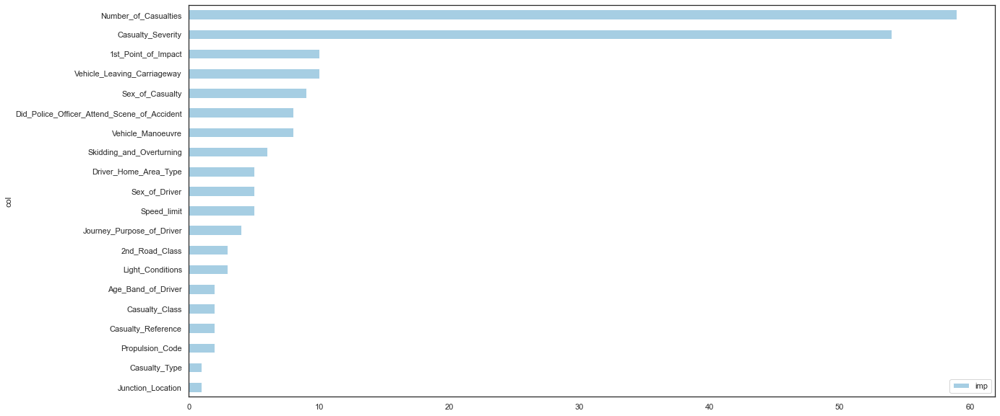

In [168]:
#Showing important features
fea_imp = pd.DataFrame({'imp':model.feature_importances_, 'col': X.columns})
fea_imp = fea_imp.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-20:]
_ = fea_imp.plot(kind='barh', x='col', y='imp', figsize=(20, 10))

In [169]:
#Assigning our features to predictors
predictors = avc3 [['Number_of_Casualties', 'Engine_Capacity_(CC)','Casualty_Severity', 
                    'Light_Conditions', 'Age_Band_of_Driver', 'Speed_limit','Vehicle_Manoeuvre', 
                    'Skidding_and_Overturning','Number_of_Vehicles','Road_Type','Vehicle_Type',
                    '1st_Point_of_Impact','Sex_of_Driver','Age_of_Vehicle','Urban_or_Rural_Area','Did_Police_Officer_Attend_Scene_of_Accident',
                   'Pedestrian_Location','Junction_Control']]

In [170]:
avc3.head()

,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Day_of_Week,Local_Authority_(District),1st_Road_Class,1st_Road_Number,Road_Type,Speed_limit,Junction_Detail,Junction_Control,2nd_Road_Class,2nd_Road_Number,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,Day,Week,Hour,Vehicle_Reference,Vehicle_Type,Towing_and_Articulation,Vehicle_Manoeuvre,Vehicle_Location-Restricted_Lane,Junction_Location,Skidding_and_Overturning,Hit_Object_in_Carriageway,Vehicle_Leaving_Carriageway,Hit_Object_off_Carriageway,1st_Point_of_Impact,Was_Vehicle_Left_Hand_Drive?,Journey_Purpose_of_Driver,Sex_of_Driver,Age_of_Driver,Age_Band_of_Driver,Engine_Capacity_(CC),Propulsion_Code,Age_of_Vehicle,Driver_IMD_Decile,Driver_Home_Area_Type,Vehicle_IMD_Decile,Casualty_Reference,Casualty_Class,Sex_of_Casualty,Age_of_Casualty,Age_Band_of_Casualty,Casualty_Severity,Pedestrian_Location,Pedestrian_Movement,Car_Passenger,Bus_or_Coach_Passenger,Pedestrian_Road_Maintenance_Worker,Casualty_Type,Casualty_Home_Area_Type,Casualty_IMD_Decile
0,528218.0,180407.0,-0.153842,51.508057,1,3,2,3,2,1,3,4202,1,30.0,1.0,2.0,3.0,4202.0,0.0,5.0,1.0,1,1.0,0.0,0.0,1,3,18,8,17,1,9.0,0.0,13.0,0.0,2.0,0.0,0.0,0.0,0.0,4.0,1.0,6.0,1.0,58.0,9.0,1849.0,2.0,8.0,2.0,1.0,2.0,1,1,1.0,58.0,9.0,3,0.0,0,0.0,0.0,0.0,9.0,1.0,2.0
1,528218.0,180407.0,-0.153842,51.508057,1,3,2,3,2,1,3,4202,1,30.0,1.0,2.0,3.0,4202.0,0.0,5.0,1.0,1,1.0,0.0,0.0,1,3,18,8,17,1,9.0,0.0,13.0,0.0,2.0,0.0,0.0,0.0,0.0,4.0,1.0,6.0,1.0,58.0,9.0,1849.0,2.0,8.0,2.0,1.0,2.0,2,2,2.0,38.0,6.0,3,0.0,0,1.0,0.0,0.0,9.0,1.0,5.0
2,528218.0,180407.0,-0.153842,51.508057,1,3,2,3,2,1,3,4202,1,30.0,1.0,2.0,3.0,4202.0,0.0,5.0,1.0,1,1.0,0.0,0.0,1,3,18,8,17,1,9.0,0.0,13.0,0.0,2.0,0.0,0.0,0.0,0.0,4.0,1.0,6.0,1.0,58.0,9.0,1849.0,2.0,8.0,2.0,1.0,2.0,3,2,2.0,38.0,6.0,3,0.0,0,2.0,0.0,0.0,9.0,1.0,5.0
3,530219.0,172463.0,-0.127949,51.436208,1,3,2,1,3,9,3,23,2,30.0,0.0,4.0,5.0,0.0,0.0,1.0,4.0,1,1.0,0.0,0.0,1,3,15,3,21,1,9.0,0.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,6.0,2.0,24.0,5.0,1849.0,2.0,8.0,3.0,1.0,3.0,1,1,2.0,24.0,5.0,3,0.0,0,0.0,0.0,0.0,9.0,1.0,3.0
4,530222.0,182543.0,-0.124193,51.526795,1,3,2,1,3,2,4,504,6,30.0,3.0,4.0,6.0,0.0,0.0,0.0,4.0,1,1.0,0.0,0.0,1,1,1,1,1,2,1.0,0.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,33.0,6.0,1849.0,2.0,8.0,5.0,1.0,5.0,1,2,2.0,21.0,5.0,3,0.0,0,0.0,0.0,0.0,1.0,1.0,1.0


In [171]:
#Assigning our predictors
X = predictors#features
y = avc3['Accident_Severity']#Target

In [172]:
X,y = smote.fit_resample(X,y.ravel())

In [174]:
# Split the data into 20% test and 80% training

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [175]:
#checking to revalidate our sampling
pd.Series(y).value_counts()

3    83921
2    83921
dtype: int64

In [191]:
#Use function to build models
def model(X_train, y_train, X_test, y_test, model):

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    training_accuracy = round(model.score(X_train, y_train)*100,2)
    score = round(accuracy_score(y_pred, y_test)*100,2)
    confusion = classification_report(y_pred, y_test)
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(pd.DataFrame(cm), annot = True, cmap = "coolwarm", fmt='g')
    print(f" Training Accuracy is: {training_accuracy}")
    print(f" Test Accuracy is: {score}")
    print(confusion)

    return score

 Training Accuracy is: 93.35
 Test Accuracy is: 93.4
              precision    recall  f1-score   support

           2       0.88      0.98      0.93     15227
           3       0.98      0.89      0.94     18342

    accuracy                           0.93     33569
   macro avg       0.93      0.94      0.93     33569
weighted avg       0.94      0.93      0.93     33569



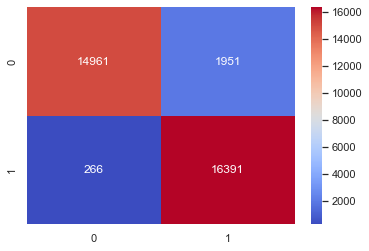

In [193]:
naive = model(X_train, y_train, X_test, y_test, GaussianNB())

 Training Accuracy is: 81.4
 Test Accuracy is: 81.57
              precision    recall  f1-score   support

           2       0.80      0.83      0.81     16440
           3       0.83      0.81      0.82     17129

    accuracy                           0.82     33569
   macro avg       0.82      0.82      0.82     33569
weighted avg       0.82      0.82      0.82     33569



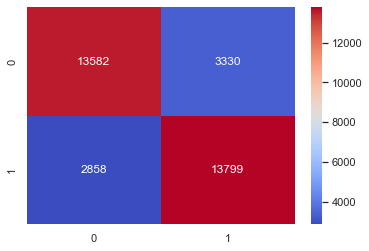

In [194]:
log = model(X_train, y_train, X_test, y_test, LogisticRegression())

>* The accident severity using The GaussianNB model has an accuracy score of 93.35 percent and a recall score of 98 percent, implying that the model delivered relevant results, whereas the Logistics regression model has an accuracy score of 81.4 percent and a recall score of 83 percent, which is similarly good.

## Comparing the performance of accident severity model with that of the government

>*Merging the avc4 dataset with the cas dataset, we would predict adjusted_serious and get the performance of our model.*

In [226]:
#reading govt data
cas.head()

,Accident_Index,Vehicle_Reference,Casualty_Reference,Adjusted_Serious,Adjusted_Slight,Injury_Based
0,200401BS00001,1,1,0.239280,0.760720,0
1,200401BS00002,1,1,1.000000,0.000000,0
2,200401BS00003,1,1,0.057141,0.942859,0
3,200401BS00003,1,2,0.048599,0.951401,0
4,200401BS00004,1,1,0.187000,0.813000,0


In [227]:
#Merge govt data with our initial data
gov = pd.merge(avc4, cas, on = ['Accident_Index', 'Vehicle_Reference', 'Casualty_Reference'], how = 'inner')

In [228]:
#dropping fatal because government didn't predict fatal
avc4 = avc4.query("Accident_Severity>1")

In [229]:
gov['max'] = gov[['Adjusted_Serious', 'Adjusted_Slight']].idxmax(axis=1)

In [233]:
#Creating function to select our data
def convert_to_num(data):
      if data == 'Adjusted_Slight':
         return 3
      else:
         return 2

In [234]:
#converting it to numerical value
gov['conv'] = gov['max'].apply(convert_to_num)

In [236]:
#Comparing our model
gov_pred = gov['conv']
actual = gov['Accident_Severity']

In [245]:
print('Accuracy Score:',metrics.accuracy_score(actual,gov_pred))

Accuracy Score: 0.9472873696700411


>* Comparing government model with 94.7% accuracy score, It's evident government model performed better than ours.

## Conclusion

## Recommendations

 - Adequate preventive measures should be made by the government to regulate drivers’
decisions, especially on the high-risk factors that affect road accidents like getting to
understand and mitigate factors that cause an increase in road accidents in the 17th hour.\
 - To keep our roads safe, it's critical to maintain their surfaces, which involves patching
potholes, crack sealing, and applying new surface treatments or sealants. Regular
maintenance improves the road's durability and minimizes the likelihood of an accident.\
- From our analysis, it was established that the type of vehicle mostly involved in accidents are petrol cars, decision makers may consider invest electric cars as such cars has been found to be less involved in accident.
- The age of the driver and the type of accident can be used to determine which accident features are common across different age groups, as well as approaches to improve driver education and thereby minimise accidents. 
- Features such as Urban area and road types inovolved in the accident was explored and we found that more occured in Urban area on single carriage road type, uncontrolled junction and 1st point impact,, attention should be paid to these types of the road due to the risk and plans should be made for intensive junction contorl in future.
